# Identification of fate biases in progenitors

In [1]:
import scanpy as sc
import numpy as np
import scanpy.external as sce
import pandas as pd
import scvelo as scv
import seaborn as sns
import matplotlib.pyplot as plt
import importlib
import sys
import symphonypy as sp
import scFates as scf
import decoupler as dc

import sys
sys.path.append("/home/sergey/tools/scLiTr/")
import sclitr as sl

import matplotlib

matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42

# Figures aesthetics
sc.set_figure_params(dpi=150)
sns.set_style("ticks")
scv.settings.verbosity = 0
sc.settings.figdir = "figures_CatBoost_Progenitors"

## Mesenchymal progenitors

In [2]:
clones = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/E13_clonal_embedding.h5ad")
clones = clones[~clones.obs["leiden_0.5"].isin(["2", "6", "7"])].copy()

adata = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_mes_E13_clonal_clusters.h5ad")
adata = sl.pp.prepare_multiple_injections(
    adata,
    injection_cols=["E7.5:clones", "E8.5:clones"],
)
adata.obs["clone"] = [i.replace("clones_", "") for i in adata.obs.clone]
adata = adata[adata.obs.clone.isin(clones.obs_names)].copy()
sc.pp.filter_genes(adata, min_cells=200)

clones = clones[clones.obs_names.isin(adata.obs.clone)]
clone_to_batch = dict(adata.obs[["clone", "batch"]].values)
clones.obs["batch"] = [clone_to_batch[i] for i in clones.obs_names]

### Precise identification of progenitors

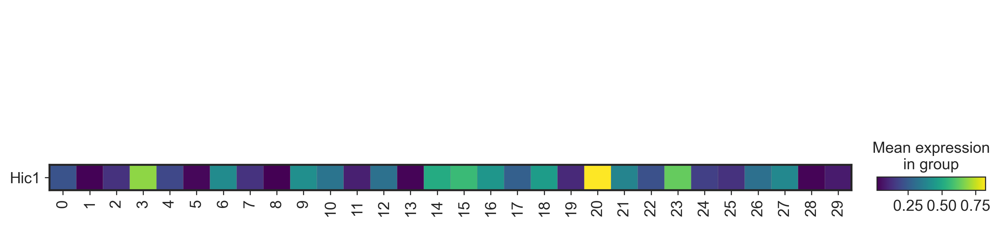

In [43]:
sc.pl.matrixplot(adata, var_names=["Hic1"], groupby="leiden_1.5", swap_axes=True,
                 save="Hic1_leiden15.pdf")

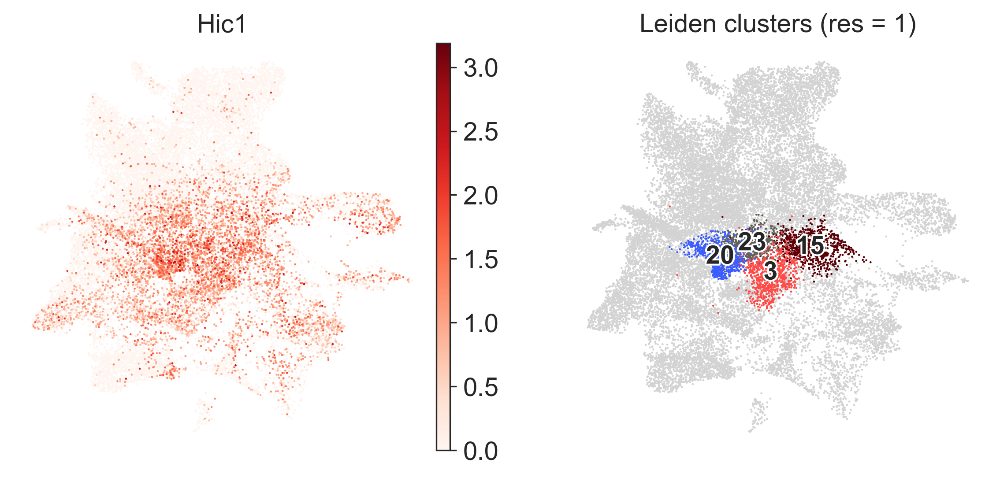

In [45]:
sc.pl.umap(
    adata,
    color=["Hic1", "leiden_1.5"],
    groups=["20", "3", "23", "15"], 
    frameon=False,
    title=["Hic1", "Leiden clusters (res = 1)"],
    na_in_legend=False,
    legend_loc="on data",
    legend_fontoutline=2,
    cmap="Reds",
    save="Hic1_leiden15.pdf"
)

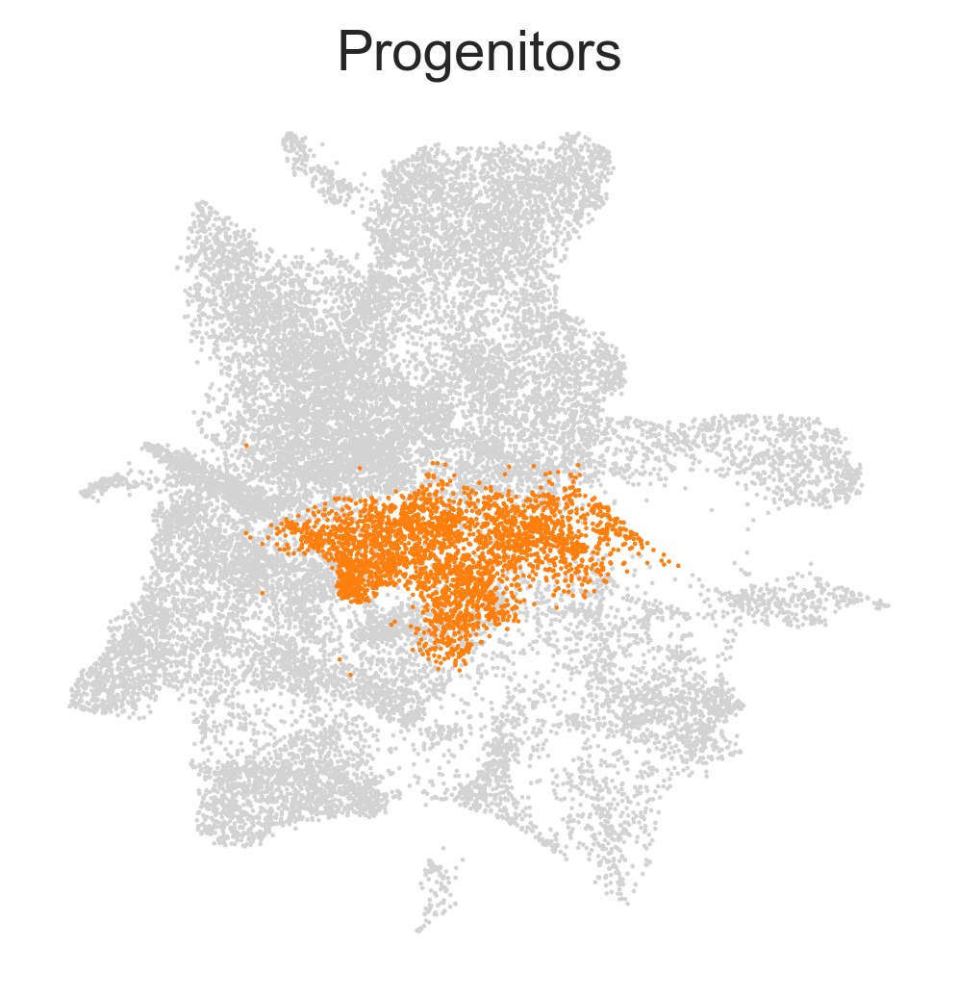

In [50]:
adata.obs["Progenitors"] = [
    "True" if leiden in ["20", "3", "23", "15"]
    else "False" for leiden in adata.obs["leiden_1.5"]
]

sc.pl.umap(adata, color="Progenitors", groups=["True"], frameon=False,
           legend_loc=None, save="mesenchyme_progenitors.pdf")

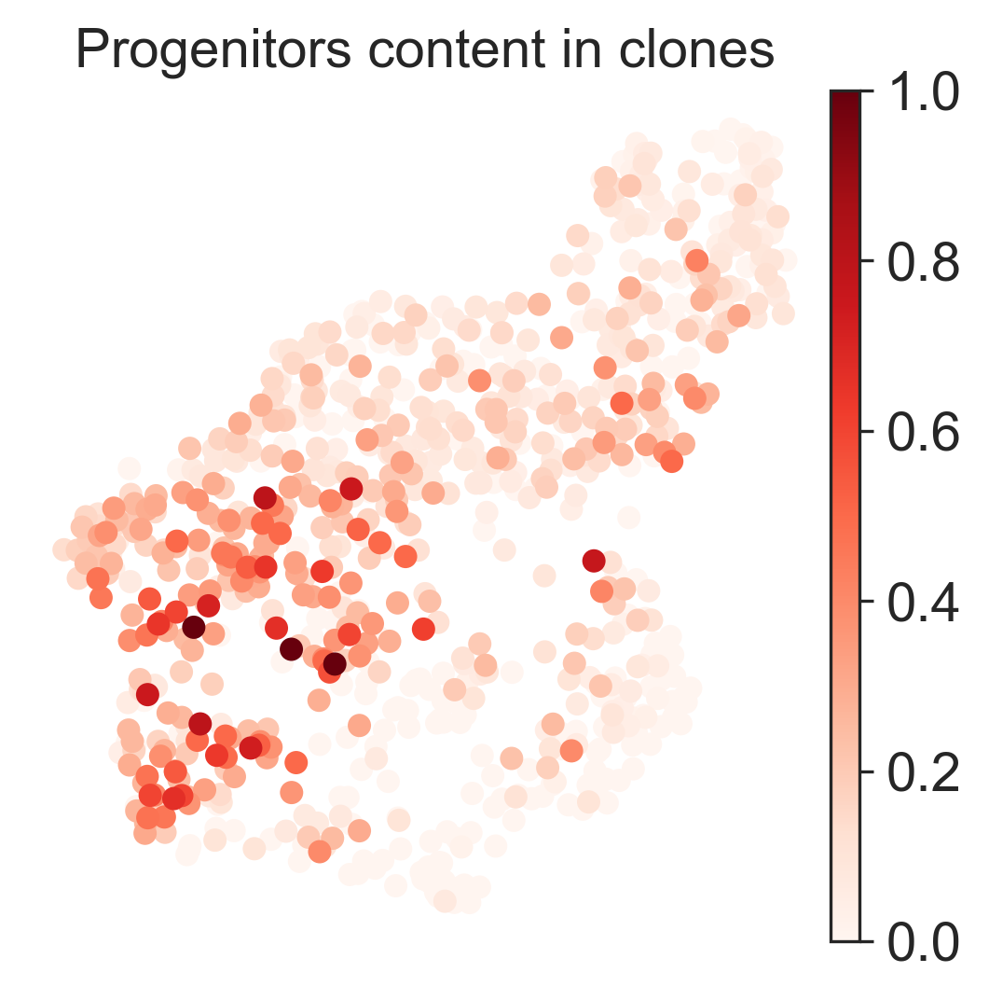

In [62]:
clones_tmp = sl.tl.refill_ct(adata, "clone", "Progenitors", clones)
sc.pl.umap(clones_tmp, color="True", layer="frequencies", cmap="Reds",
           frameon=False, title="Progenitors content in clones",
           save="_clone2vec_progenitors_content.pdf")

In [83]:
# Preparation

ct_whitelist = list(clones.var_names[(clones.X > 0).sum(axis=0).astype(int) > 50])

clones_clear = clones[:, ct_whitelist].copy()
clones_clear.layers["frequencies"] = (clones_clear.X.T / clones_clear.X.sum(axis=1)).T
clones_clear = clones_clear[clones_clear.X.sum(axis=1) > 5].copy()

adata_clear = adata[adata.obs.clone.isin(clones_clear.obs_names)].copy()

In [ ]:
shapdata_c2v = sl.tl.predict_c2v(
    adata_clear,
    clones_clear,
    clone_col="clone",
    ct_col="Progenitors",
    use_gpu=True,
    verbose=True,
    limit_ct="True",
    use_ct=False,
    pseudobulk=True,
    use_rep="word2vec",
    filename="CatBoost_Progenitors/progenitors_c2v.cbm",
)

shapdata_c2v.write_h5ad("CatBoost_Progenitors/progenitors_c2v.h5ad")
clones_clear.obs.to_csv("CatBoost_Progenitors/train_eval.csv")

0:	learn: 4.8299030	test: 5.3324272	best: 5.3324272 (0)	total: 327ms	remaining: 54m 29s
1:	learn: 4.7851245	test: 5.3021190	best: 5.3021190 (1)	total: 569ms	remaining: 47m 25s
2:	learn: 4.7414564	test: 5.2723344	best: 5.2723344 (2)	total: 829ms	remaining: 46m 2s
3:	learn: 4.6984754	test: 5.2411262	best: 5.2411262 (3)	total: 1.09s	remaining: 45m 19s
4:	learn: 4.6605888	test: 5.2159051	best: 5.2159051 (4)	total: 1.35s	remaining: 45m 6s
5:	learn: 4.6160890	test: 5.1865850	best: 5.1865850 (5)	total: 1.61s	remaining: 44m 43s
6:	learn: 4.5754587	test: 5.1562841	best: 5.1562841 (6)	total: 1.84s	remaining: 43m 52s
7:	learn: 4.5377650	test: 5.1376421	best: 5.1376421 (7)	total: 2.08s	remaining: 43m 23s
8:	learn: 4.4979848	test: 5.1106468	best: 5.1106468 (8)	total: 2.33s	remaining: 43m 7s
9:	learn: 4.4610238	test: 5.0849315	best: 5.0849315 (9)	total: 2.56s	remaining: 42m 38s
10:	learn: 4.4272051	test: 5.0674315	best: 5.0674315 (10)	total: 2.81s	remaining: 42m 36s
11:	learn: 4.3913124	test: 5.0460

In [110]:
shapdata_ct = sl.tl.predict_ct(
    adata_clear,
    clones_clear,
    clone_col="clone",
    ct_col="Progenitors",
    use_gpu=True,
    verbose=True,
    limit_ct="True",
    use_ct=False,
    pseudobulk=True,
    ct_layer="frequencies",
    use_rep="word2vec",
    filename="CatBoost_Progenitors/progenitors_ct.cbm",
)

shapdata_ct.write_h5ad("CatBoost_Progenitors/progenitors_ct.h5ad")

Learning rate set to 0.02908
0:	learn: 0.6486045	test: 0.6484784	best: 0.6484784 (0)	total: 434ms	remaining: 1h 12m 16s
1:	learn: 0.6087409	test: 0.6087358	best: 0.6087358 (1)	total: 830ms	remaining: 1h 9m 10s
2:	learn: 0.5721960	test: 0.5738982	best: 0.5738982 (2)	total: 1.18s	remaining: 1h 5m 33s
3:	learn: 0.5398066	test: 0.5417139	best: 0.5417139 (3)	total: 1.6s	remaining: 1h 6m 40s
4:	learn: 0.5089329	test: 0.5114538	best: 0.5114538 (4)	total: 1.98s	remaining: 1h 6m 7s
5:	learn: 0.4816273	test: 0.4847705	best: 0.4847705 (5)	total: 2.4s	remaining: 1h 6m 38s
6:	learn: 0.4557951	test: 0.4589587	best: 0.4589587 (6)	total: 2.78s	remaining: 1h 6m 13s
7:	learn: 0.4334070	test: 0.4369050	best: 0.4369050 (7)	total: 3.21s	remaining: 1h 6m 52s
8:	learn: 0.4117306	test: 0.4163650	best: 0.4163650 (8)	total: 3.53s	remaining: 1h 5m 21s
9:	learn: 0.3919620	test: 0.3968846	best: 0.3968846 (9)	total: 3.85s	remaining: 1h 4m 8s
10:	learn: 0.3746225	test: 0.3798228	best: 0.3798228 (10)	total: 4.2s	rema

In [117]:
shapdata_ct.var["gene_importance"] = shapdata_ct.layers["shap"].mean(axis=0).A[0]
shapdata_c2v.var["gene_importance"] = shapdata_c2v.layers["shap"].mean(axis=0).A[0]

df = pd.DataFrame({
    "clone2vec": shapdata_c2v.var["gene_importance"].loc[shapdata_ct.var_names],
    "cell_type": shapdata_ct.var["gene_importance"],
})

df["clone2vec"] = df.clone2vec / df.clone2vec.max() * 100
df["cell_type"] = df.cell_type / df.cell_type.max() * 100

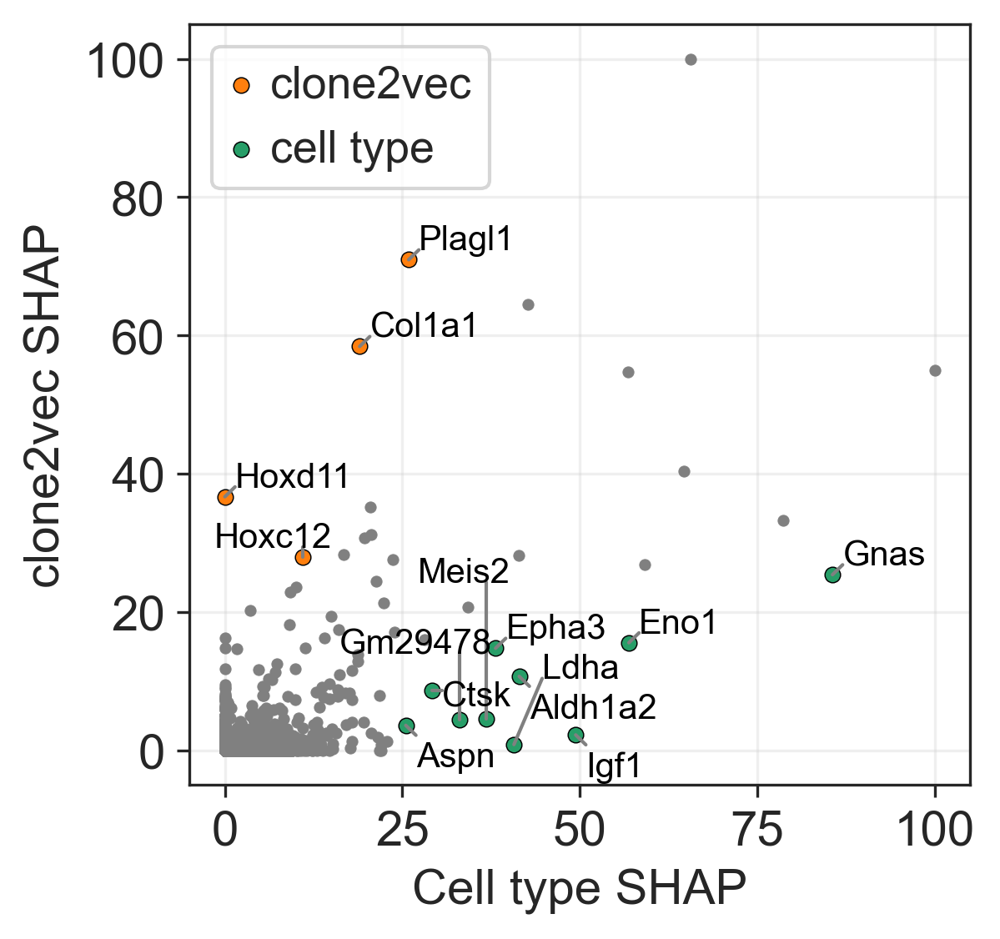

In [130]:
import textalloc as ta

ax = sns.scatterplot(
    x=df.cell_type,
    y=df.clone2vec,
    s=10,
    edgecolor=None,
    color="grey",
)

c2v_more = df[
    (df.clone2vec / df.cell_type > 2.5) &
    (df.clone2vec > 25)
]
sns.scatterplot(
    x=c2v_more.cell_type,
    y=c2v_more.clone2vec,
    s=20,
    edgecolor="black",
    color=sns.color_palette()[1],
    label="clone2vec",
)

ct_more = df[
    (df.clone2vec / df.cell_type < 1/2.5) &
    (df.cell_type > 25)
]
sns.scatterplot(
    x=ct_more.cell_type,
    y=ct_more.clone2vec,
    s=20,
    edgecolor="black",
    color=sns.color_palette()[2],
    label="cell type",
)

ta.allocate(
    ax,
    x=pd.concat([ct_more, c2v_more], axis=0).cell_type,
    y=pd.concat([ct_more, c2v_more], axis=0).clone2vec,
    text_list=pd.concat([ct_more, c2v_more], axis=0).index,
    x_scatter=df.cell_type,
    y_scatter=df.clone2vec,
    textsize=10,
    linecolor="grey",
)

ax.grid(alpha=0.3)
ax.set_xlabel("Cell type SHAP")
ax.set_ylabel("clone2vec SHAP")

plt.savefig("figures_CatBoost_Progenitors/c2v_vs_ct.pdf", bbox_inches="tight")

In [121]:
from tqdm import tqdm

expr_matrix = shapdata_ct.X.A

for ct in tqdm(clones_clear.var_names):
    shap_matrix = shapdata_ct.layers[f"shap_{ct}"].A
    correlations = []
    for i in range(expr_matrix.shape[1]):
        correlations.append(np.corrcoef(expr_matrix[:, i], shap_matrix[:, i])[0, 1])
    shapdata_ct.var[f"shap_corr_{ct}"] = correlations
    shapdata_ct.var[f"shap_corr_{ct}"] = shapdata_ct.var[f"shap_corr_{ct}"].fillna(0)

100%|██████████| 21/21 [00:48<00:00,  2.29s/it]


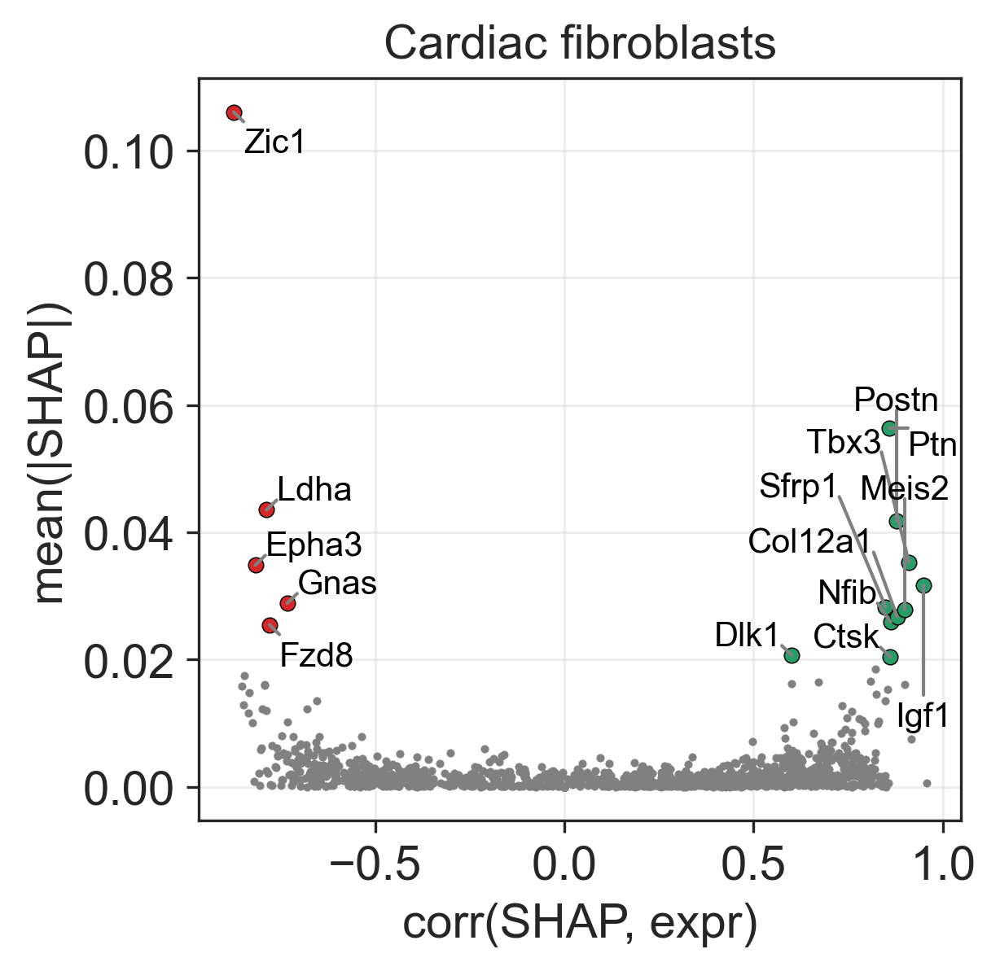

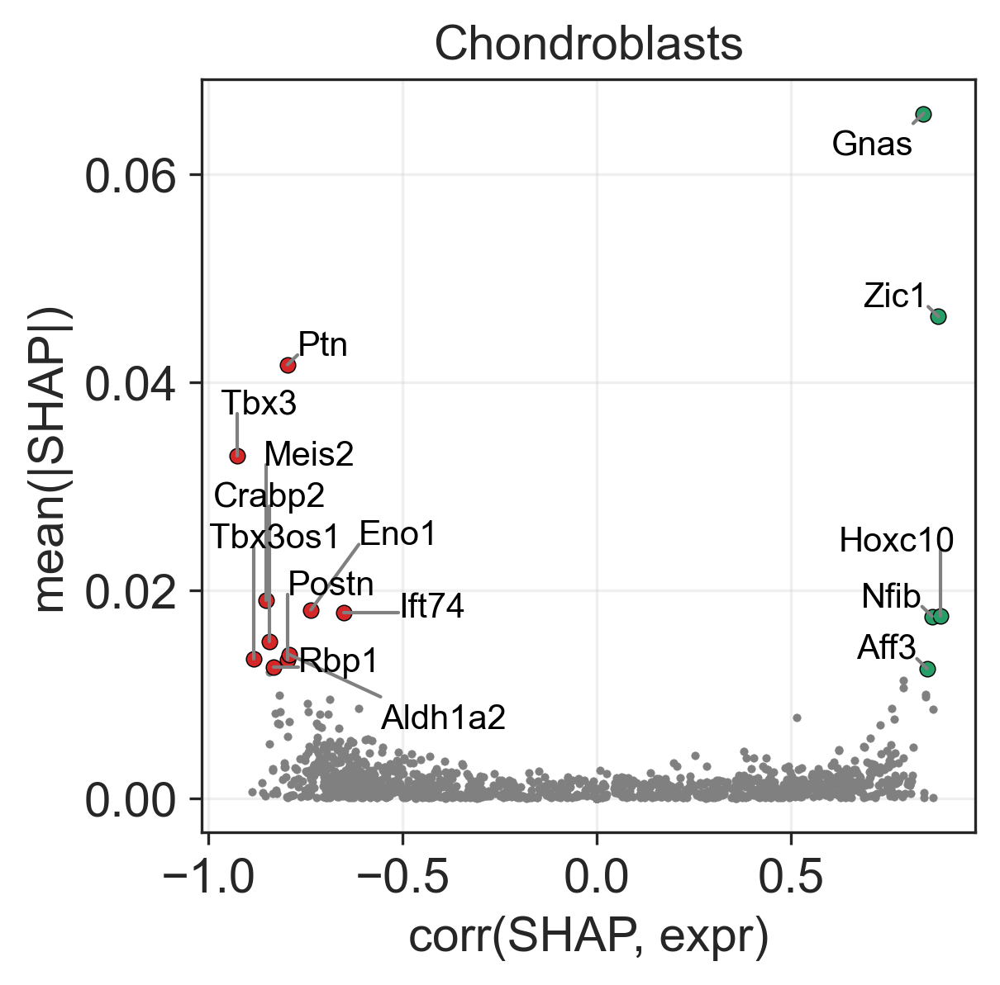

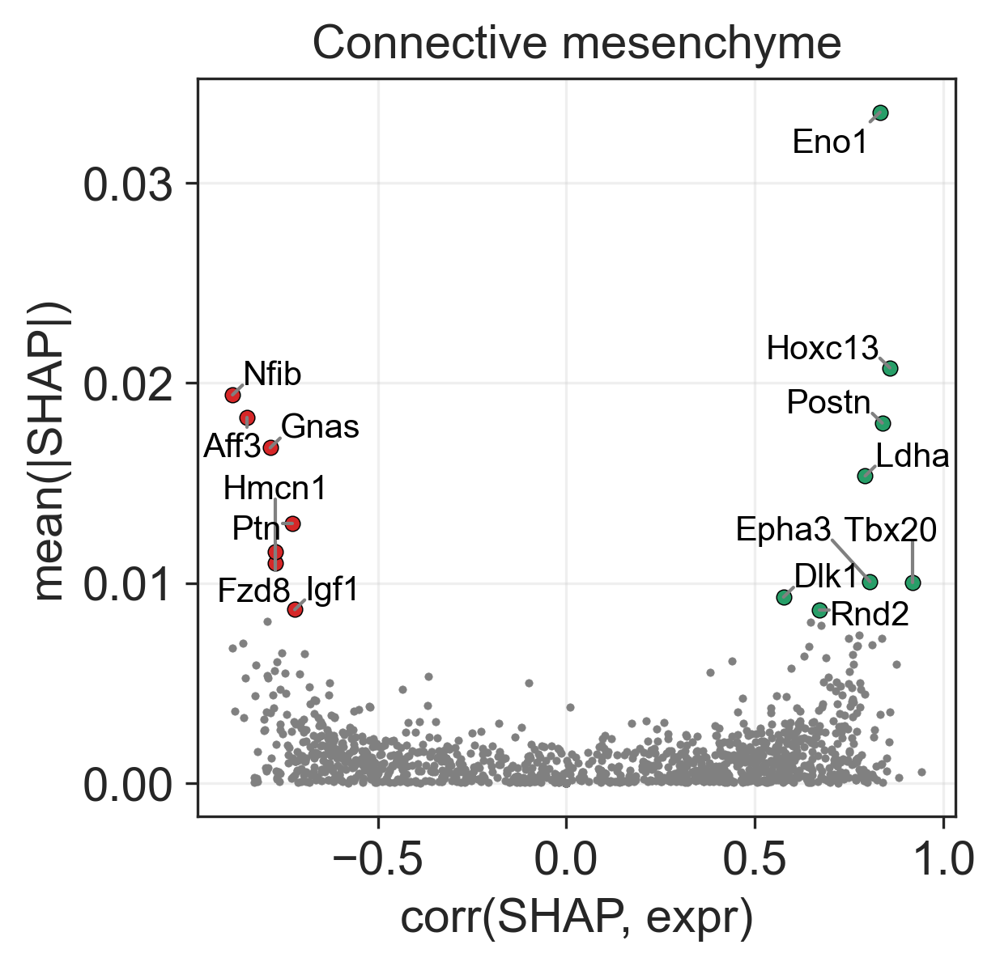

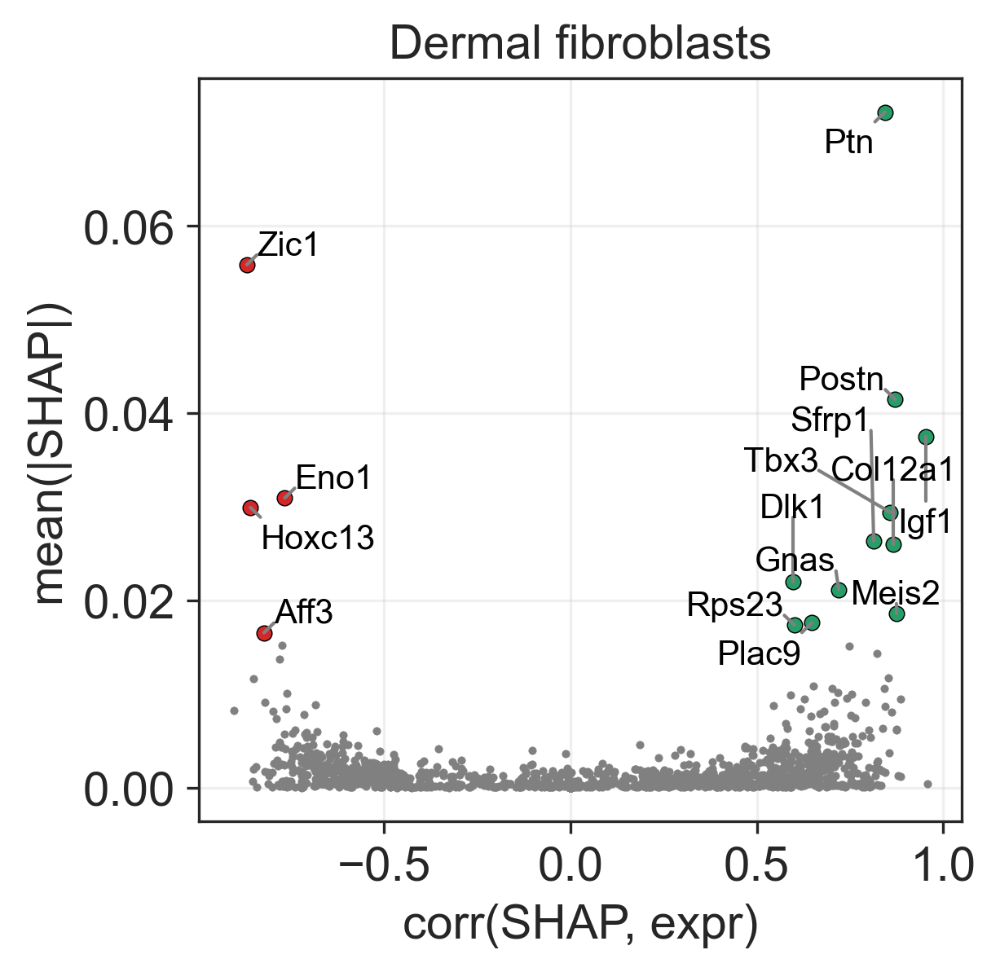

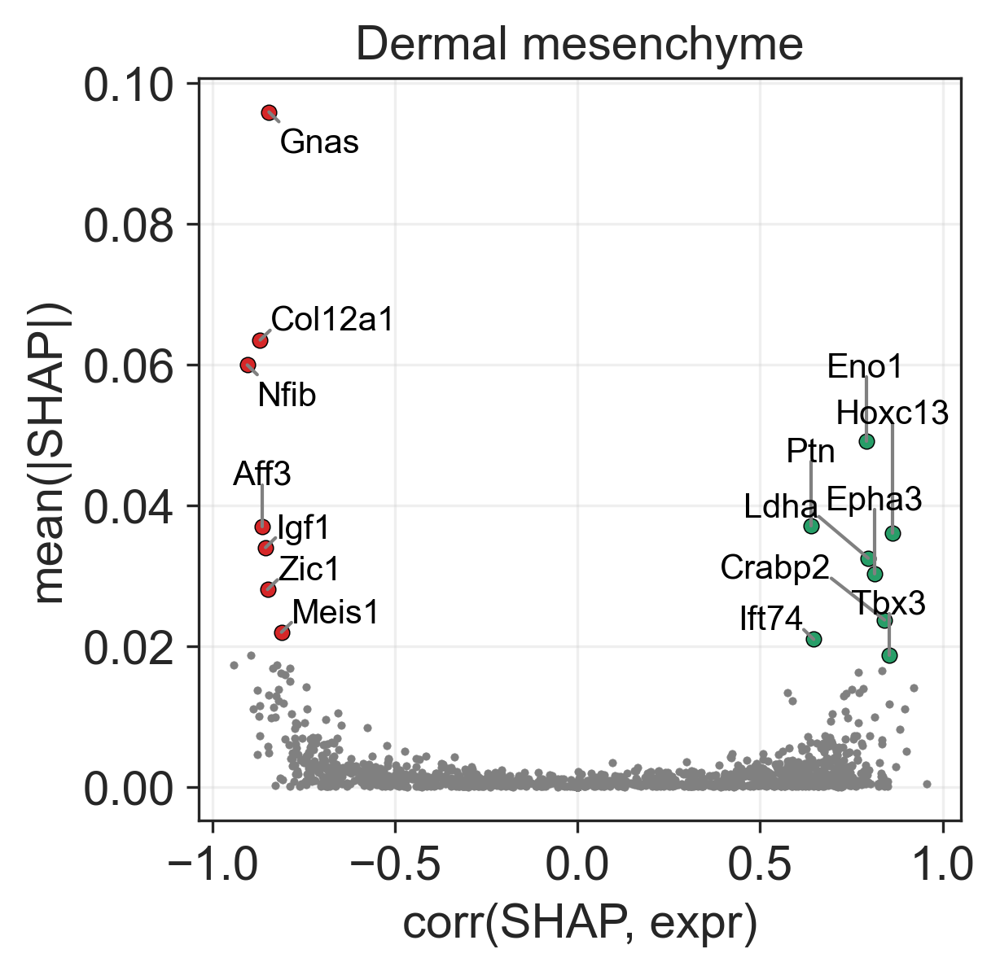

...

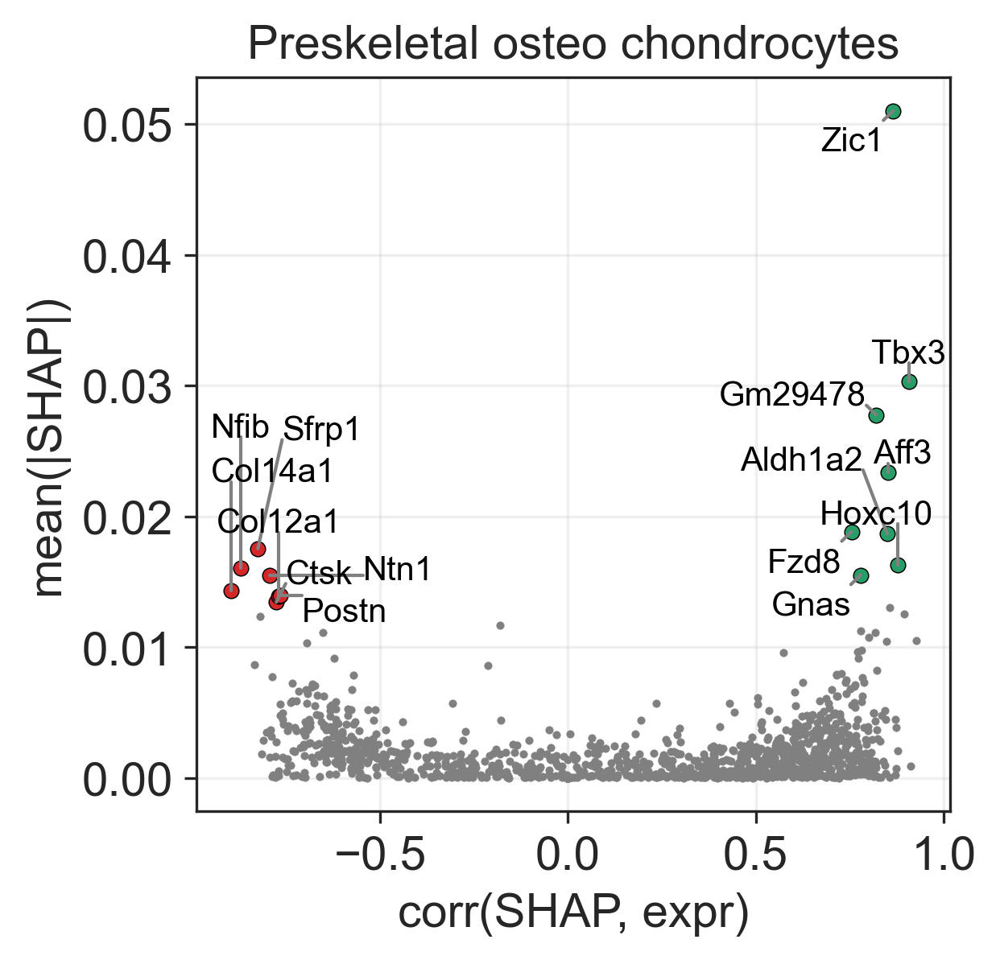

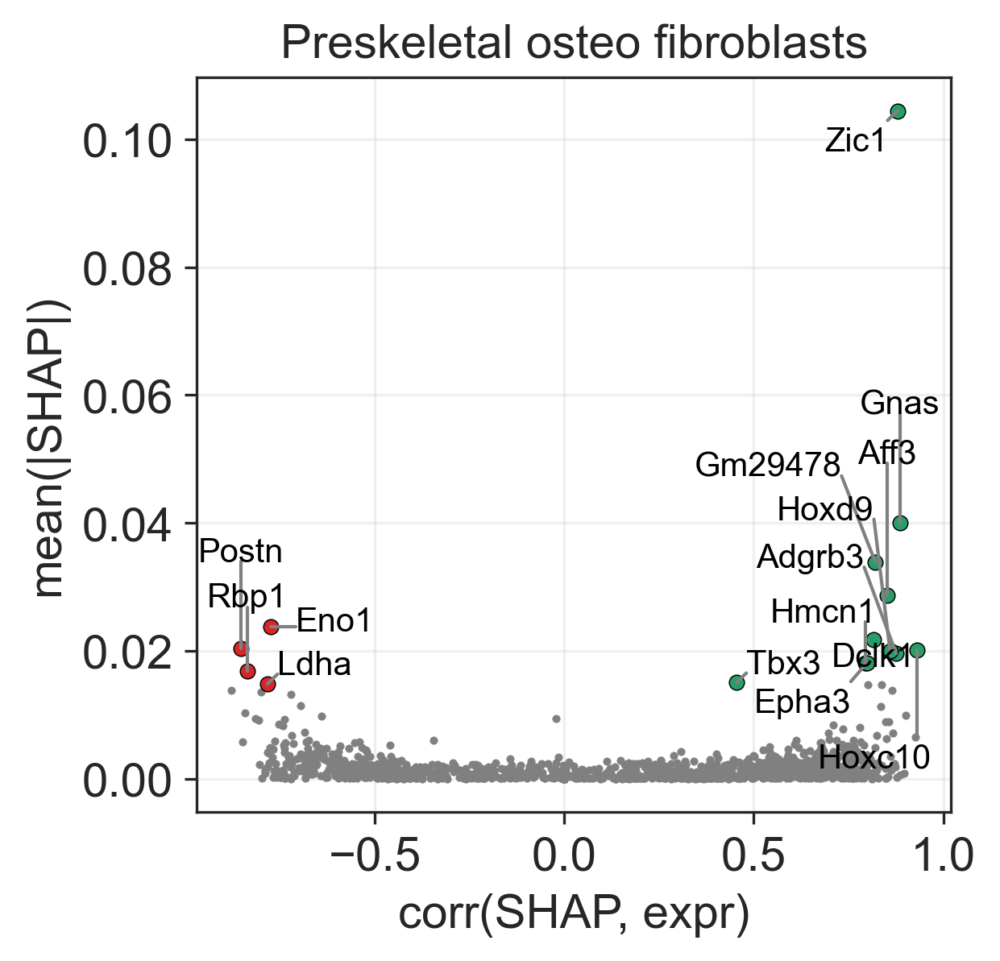

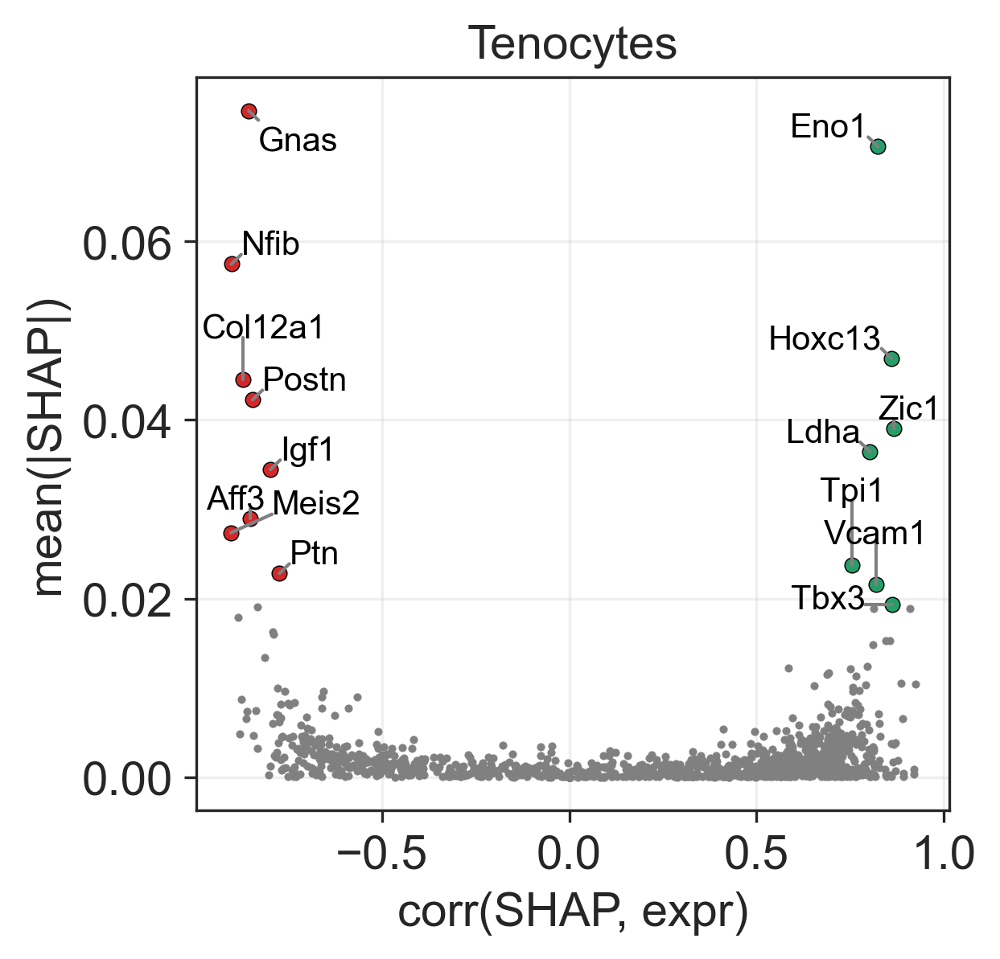

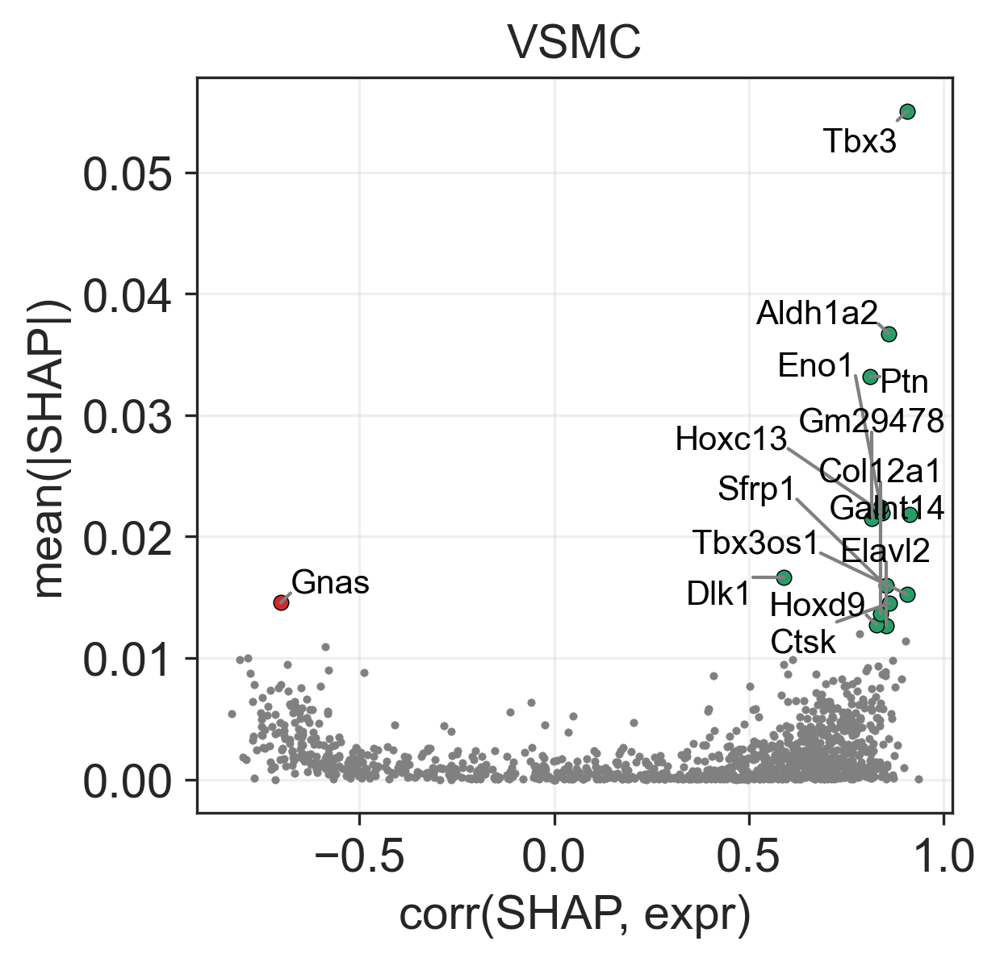

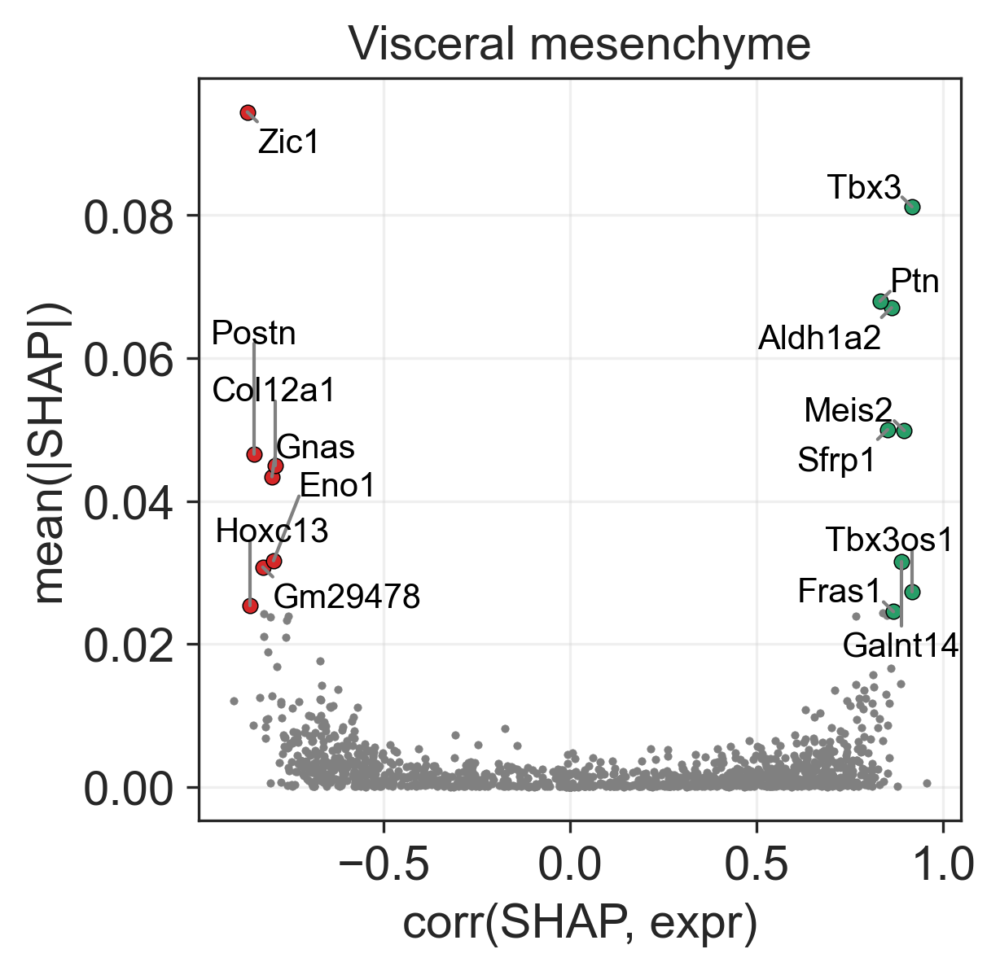

In [131]:
n_genes = 15

for ct in clones_clear.var_names:
    fig, ax = plt.subplots(figsize=(4, 4))
    
    df = pd.DataFrame({
        "shap_correlation": shapdata_ct.var[f"shap_corr_{ct}"].values,
        "mean_shap_mag": np.abs(shapdata_ct.layers[f"shap_{ct}"]).mean(axis=0).A[0],
    }, index=shapdata_ct.var_names)

    sns.scatterplot(
        x="shap_correlation",
        y="mean_shap_mag",
        data=df,
        edgecolor=None,
        s=5,
        color="grey",
        ax=ax,
    )

    # Top-predictors
    df_subset = df.loc[df.mean_shap_mag.sort_values()[-n_genes:].index]
    sns.scatterplot(
        x="shap_correlation",
        y="mean_shap_mag",
        data=df_subset[df_subset.shap_correlation > 0],
        edgecolor="black",
        s=20,
        color=sns.color_palette()[2],
        ax=ax,
    )
    
    sns.scatterplot(
        x="shap_correlation",
        y="mean_shap_mag",
        data=df_subset[df_subset.shap_correlation < 0],
        edgecolor="black",
        s=20,
        color=sns.color_palette()[3],
        ax=ax,
    )
    
    ta.allocate(
        ax,
        x=df_subset.shap_correlation,
        y=df_subset.mean_shap_mag,
        text_list=df_subset.index,
        x_scatter=df.shap_correlation,
        y_scatter=df.mean_shap_mag,
        textsize=10,
        linecolor="grey",
    )

    ax.set_xlabel("corr(SHAP, expr)")
    ax.set_ylabel("mean(|SHAP|)")
    ax.grid(alpha=0.3)
    ax.set_title(ct)

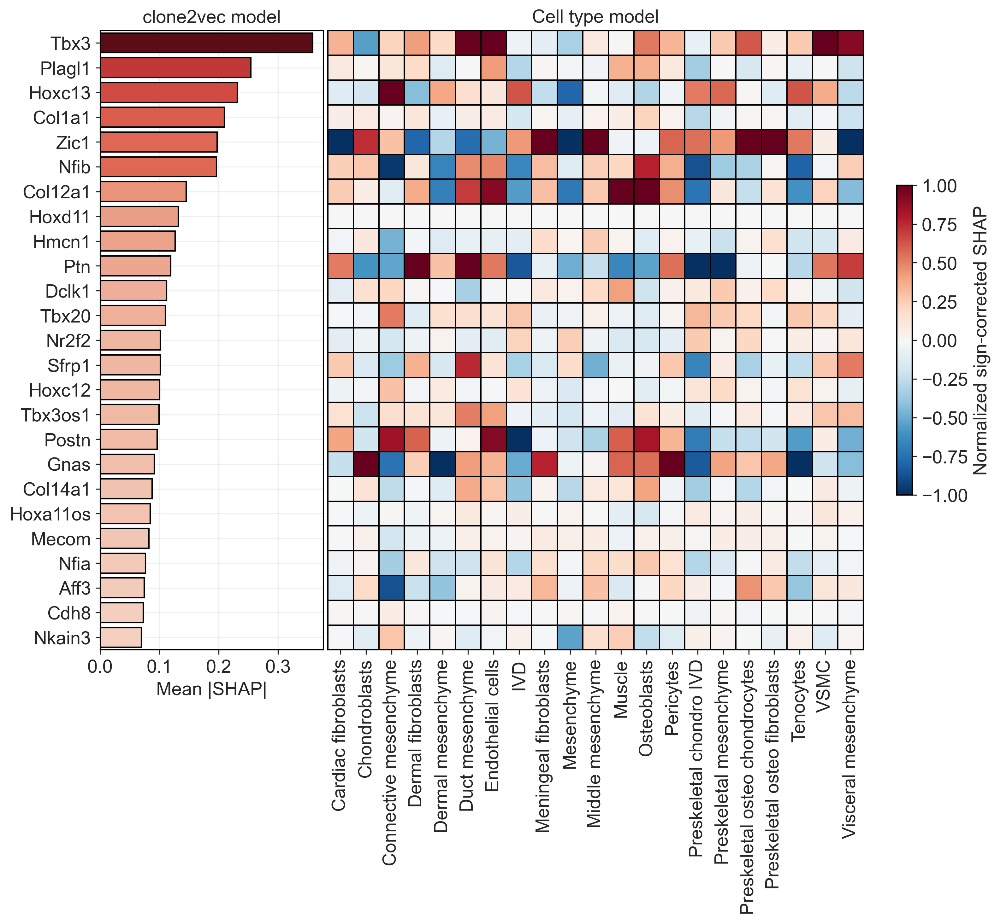

In [136]:
n_top_genes = 25
width = 11
cmap_barplot = "Reds"
cmap_heatmap = "RdBu_r"
normalize = True

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    top_genes = shapdata_c2v.var.gene_importance.sort_values(ascending=False)[:n_top_genes]
    cts = [i.split("_")[1] for i in list(shapdata_ct.layers.keys()) if "shap_" in i]

    fig, axes = plt.subplots(ncols=2, figsize=(width, 0.4 * n_top_genes), gridspec_kw={"width_ratios": [1, 3]})

    # Plotting of the clone2vec SHAP values

    # Create a colorscheme
    norm = plt.Normalize(0, top_genes.max())
    sm = plt.cm.ScalarMappable(cmap=cmap_barplot, norm=norm)
    bar_colors = plt.cm.get_cmap(cmap_barplot)(norm(top_genes))

    sns.barplot(
        x=top_genes,
        y=top_genes.index,
        ax=axes[0],
        edgecolor="k",
        palette=bar_colors,
    )
    axes[0].grid(alpha=0.3)
    axes[0].set_xlabel("Mean |SHAP|")
    axes[0].set_ylabel("")
    # axes[0].legend_.remove()
    axes[0].set_title("clone2vec model")
    
    for spine in axes[0].spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1)
        spine.set_edgecolor("k")

    heatmap = {}
    for ct in cts:
        heatmap[ct] = (
            np.abs(shapdata_ct[:, top_genes.index].layers[f"shap_{ct}"]).mean(axis=0).A[0] *
            shapdata_ct[:, top_genes.index].var[f"shap_corr_{ct}"].values
        )
        
    heatmap = pd.DataFrame(heatmap, index=top_genes.index)
    if normalize:
        heatmap = heatmap / np.abs(heatmap).max(axis=0)
    
    sns.heatmap(heatmap, cmap=cmap_heatmap, vmin=-heatmap.max().max(), ax=axes[1],
                linecolor="k", linewidth=0.5, cbar_kws={"shrink": 0.5})
    axes[1].set_yticks([], [])
    
    for spine in axes[1].spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1)
        spine.set_edgecolor("k")
        
    cbar = axes[1].collections[0].colorbar

    # Style the colorbar's border (spines)
    for spine in cbar.ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1)
        spine.set_edgecolor("k")
        
    axes[1].set_title("Cell type model")
    if normalize:
        cbar.set_label("Normalized sign-corrected SHAP")
    else:
        cbar.set_label("Sign-corrected SHAP")
    
plt.tight_layout()
plt.subplots_adjust(wspace=0.01)

plt.savefig("figures_CatBoost_Progenitors/overview_mesenchyme.pdf", bbox_inches="tight")

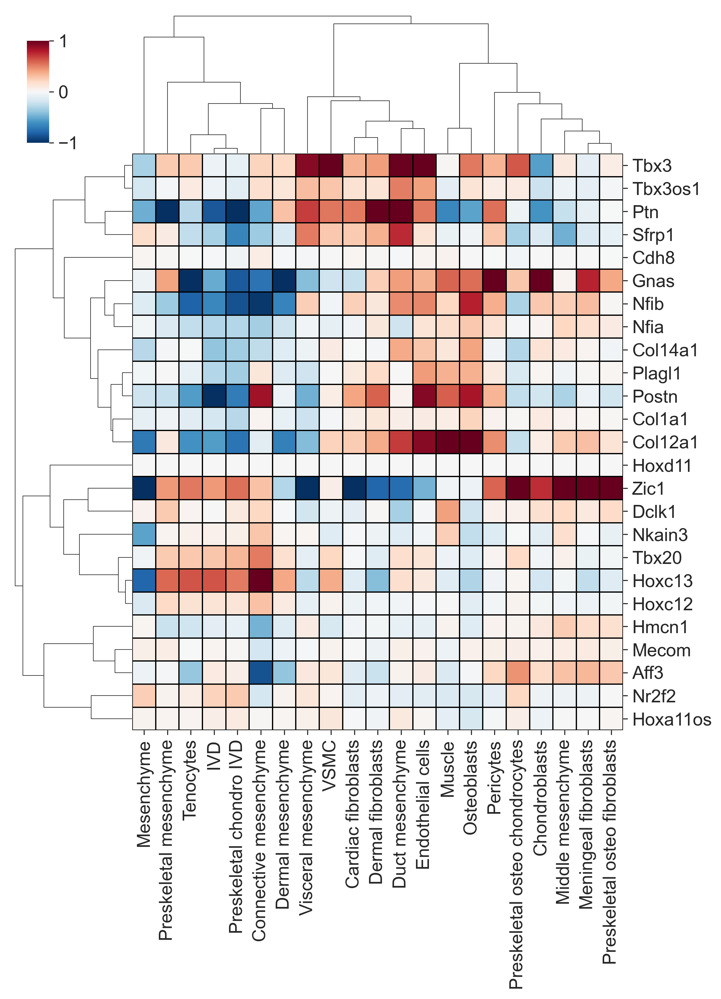

In [164]:
sns.clustermap(
    heatmap + 1e-20,
    cmap="RdBu_r",
    figsize=(8, 11),
    linecolor="k",
    linewidth=0.5,
    cbar_pos=(0.05, 0.85, 0.03, 0.1),
    metric="cosine",
)

plt.savefig("figures_CatBoost_Progenitors/clustermap_mesenchyme.pdf", bbox_inches="tight")

## Neuronal progenitors

In [2]:
clones = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/E13_clonal_embedding.h5ad")
clones = clones[clones.obs["leiden_0.5"].isin(["2", "6"])].copy()

adata = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_neur_E13_clonal_clusters.h5ad")
adata = sl.pp.prepare_multiple_injections(
    adata,
    injection_cols=["E7.5:clones", "E8.5:clones"],
)
adata.obs["clone"] = [i.replace("clones_", "") for i in adata.obs.clone]
adata = adata[adata.obs.clone.isin(clones.obs_names)].copy()
sc.pp.filter_genes(adata, min_cells=50)

clones = clones[clones.obs_names.isin(adata.obs.clone)]
clone_to_batch = dict(adata.obs[["clone", "batch"]].values)
clones.obs["batch"] = [clone_to_batch[i] for i in clones.obs_names]

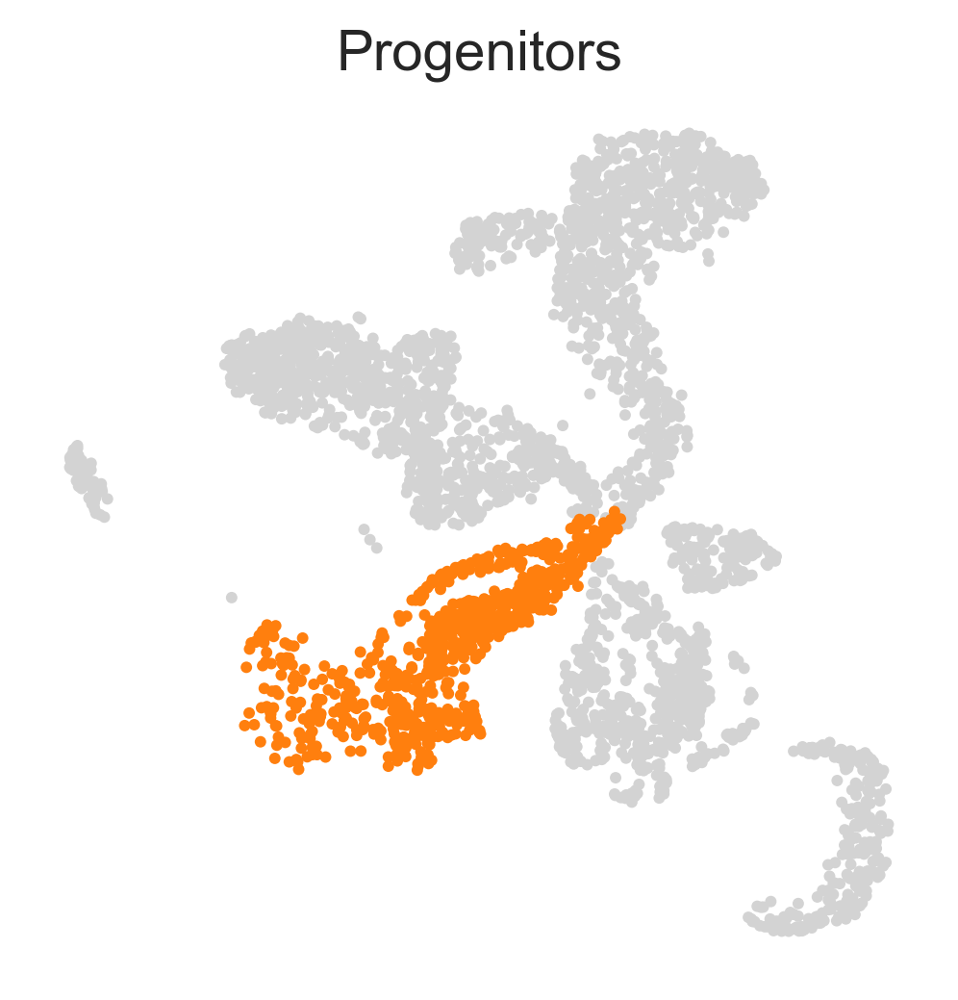

In [3]:
progenitors = [
    "Dorsal progenitor medial", "CNS progenitor",
    "Ventral motor progenitor", "Ventral progenitors",
]

adata.obs["Progenitors"] = [
    "True" if ct in progenitors
    else "False" for ct in adata.obs["celltype_l2"]
]

sc.pl.umap(adata, color="Progenitors", groups=["True"], frameon=False,
           legend_loc=None, save="neuronal_progenitors.pdf")

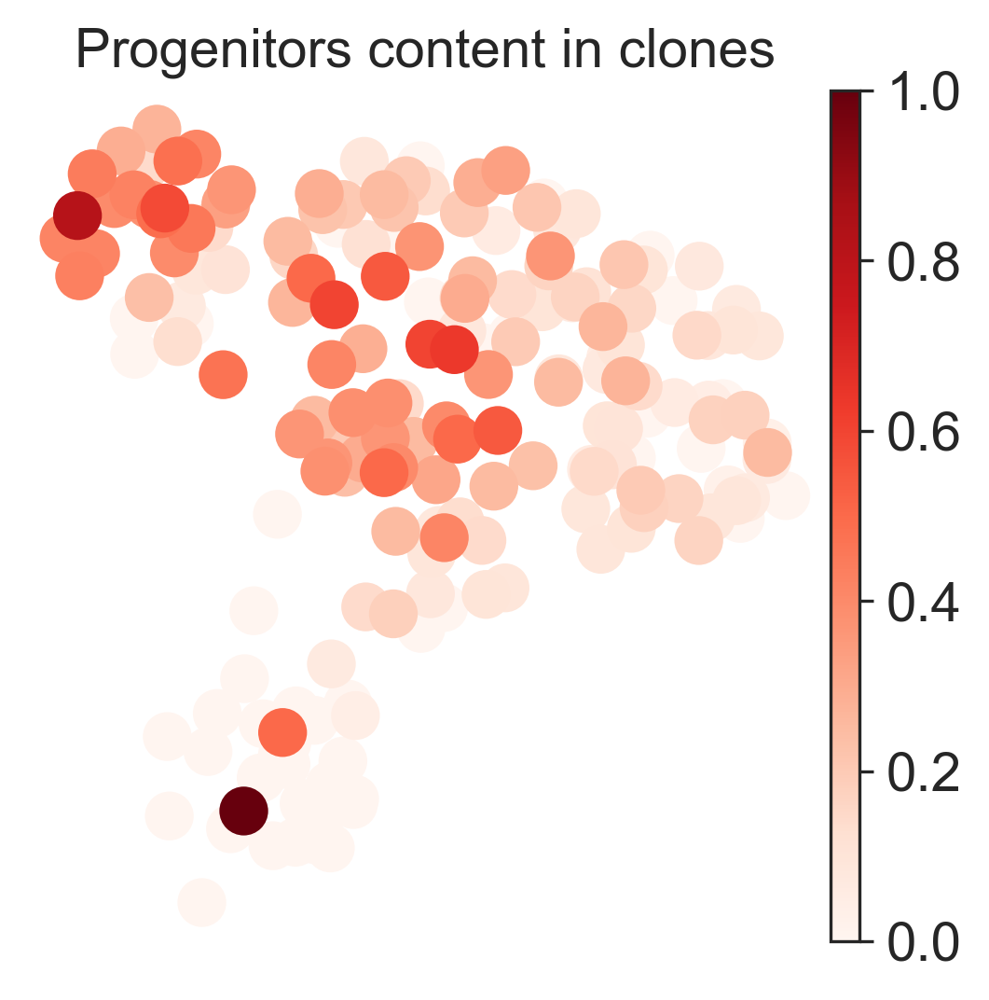

In [4]:
clones_tmp = sl.tl.refill_ct(adata, "clone", "Progenitors", clones)
sc.pl.umap(clones_tmp, color="True", layer="frequencies", cmap="Reds",
           frameon=False, title="Progenitors content in clones",
           save="_clone2vec_progenitors_content_neurons.pdf")

In [5]:
# Preparation

ct_whitelist = list(clones.var_names[(clones.X > 0).sum(axis=0).astype(int) > 30])

clones_clear = clones[:, ct_whitelist].copy()
clones_clear.layers["frequencies"] = (clones_clear.X.T / clones_clear.X.sum(axis=1)).T
clones_clear = clones_clear[clones_clear.X.sum(axis=1) > 3].copy()

adata_clear = adata[adata.obs.clone.isin(clones_clear.obs_names)].copy()

In [ ]:
shapdata_c2v = sl.tl.predict_c2v(
    adata_clear,
    clones_clear,
    clone_col="clone",
    ct_col="Progenitors",
    use_gpu=True,
    verbose=True,
    limit_ct="True",
    use_ct=False,
    pseudobulk=True,
    use_rep="word2vec",
    filename="CatBoost_Progenitors/neuronal_progenitors_c2v.cbm",
)

shapdata_c2v.write_h5ad("CatBoost_Progenitors/neuronal_progenitors_c2v.h5ad")
clones_clear.obs.to_csv("CatBoost_Progenitors/neuronal_train_eval.csv")

0:	learn: 4.0147679	test: 4.6148347	best: 4.6148347 (0)	total: 160ms	remaining: 26m 43s
1:	learn: 3.9850207	test: 4.6130954	best: 4.6130954 (1)	total: 281ms	remaining: 23m 22s
2:	learn: 3.9520692	test: 4.6108461	best: 4.6108461 (2)	total: 410ms	remaining: 22m 45s
3:	learn: 3.9175717	test: 4.6045923	best: 4.6045923 (3)	total: 541ms	remaining: 22m 32s
4:	learn: 3.8855720	test: 4.5991453	best: 4.5991453 (4)	total: 678ms	remaining: 22m 35s
5:	learn: 3.8565472	test: 4.5975650	best: 4.5975650 (5)	total: 809ms	remaining: 22m 28s
6:	learn: 3.8242791	test: 4.5916334	best: 4.5916334 (6)	total: 942ms	remaining: 22m 24s
7:	learn: 3.7929388	test: 4.5835945	best: 4.5835945 (7)	total: 1.08s	remaining: 22m 34s
8:	learn: 3.7626686	test: 4.5736446	best: 4.5736446 (8)	total: 1.22s	remaining: 22m 37s
9:	learn: 3.7342898	test: 4.5663465	best: 4.5663465 (9)	total: 1.34s	remaining: 22m 15s
10:	learn: 3.7022327	test: 4.5586158	best: 4.5586158 (10)	total: 1.47s	remaining: 22m 16s
11:	learn: 3.6749586	test: 4.5

In [ ]:
shapdata_ct = sl.tl.predict_ct(
    adata_clear,
    clones_clear,
    clone_col="clone",
    ct_col="Progenitors",
    use_gpu=True,
    verbose=True,
    limit_ct="True",
    use_ct=False,
    pseudobulk=True,
    ct_layer="frequencies",
    use_rep="word2vec",
    filename="CatBoost_Progenitors/neuronal_progenitors_ct.cbm",
)

shapdata_ct.write_h5ad("CatBoost_Progenitors/neuronal_progenitors_ct.h5ad")

In [17]:
shapdata_ct.var["gene_importance"] = shapdata_ct.layers["shap"].mean(axis=0).A[0]
shapdata_c2v.var["gene_importance"] = shapdata_c2v.layers["shap"].mean(axis=0).A[0]

df = pd.DataFrame({
    "clone2vec": shapdata_c2v.var["gene_importance"].loc[shapdata_ct.var_names],
    "cell_type": shapdata_ct.var["gene_importance"],
})

df["clone2vec"] = df.clone2vec / df.clone2vec.max() * 100
df["cell_type"] = df.cell_type / df.cell_type.max() * 100

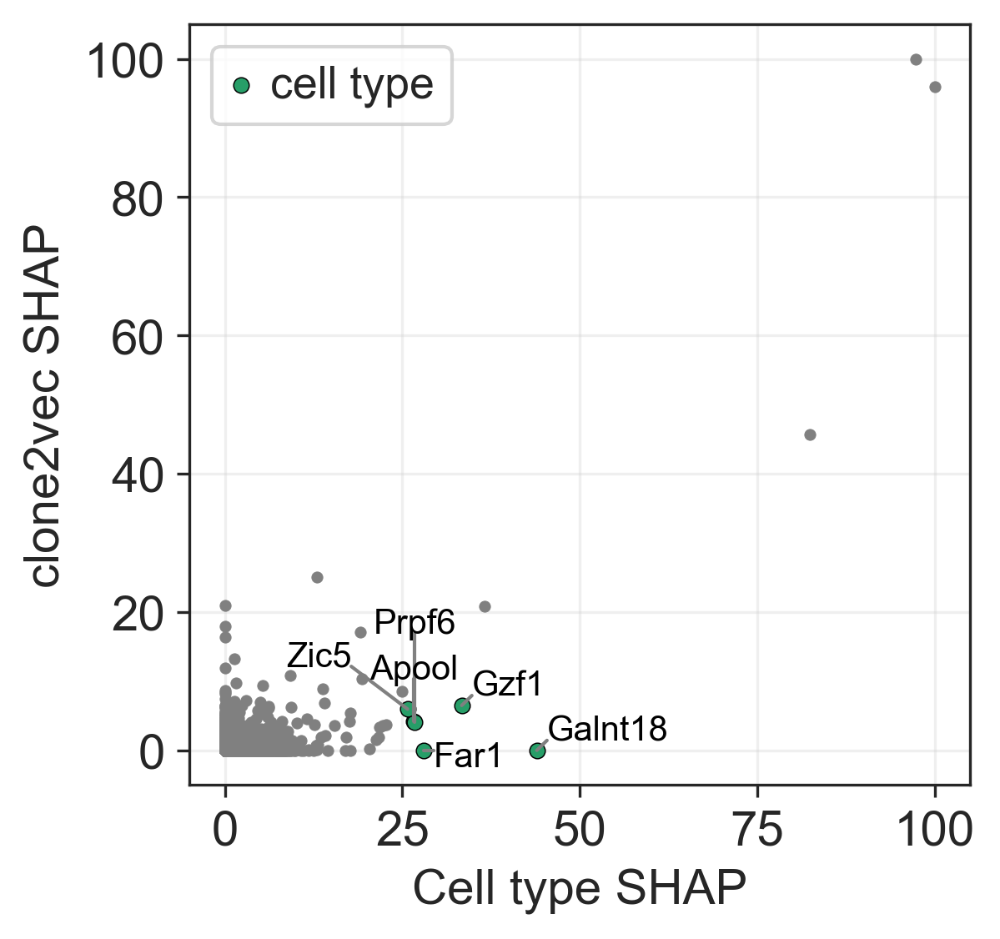

In [18]:
import textalloc as ta

ax = sns.scatterplot(
    x=df.cell_type,
    y=df.clone2vec,
    s=10,
    edgecolor=None,
    color="grey",
)

c2v_more = df[
    (df.clone2vec / df.cell_type > 2.5) &
    (df.clone2vec > 25)
]
sns.scatterplot(
    x=c2v_more.cell_type,
    y=c2v_more.clone2vec,
    s=20,
    edgecolor="black",
    color=sns.color_palette()[1],
    label="clone2vec",
)

ct_more = df[
    (df.clone2vec / df.cell_type < 1/2.5) &
    (df.cell_type > 25)
]
sns.scatterplot(
    x=ct_more.cell_type,
    y=ct_more.clone2vec,
    s=20,
    edgecolor="black",
    color=sns.color_palette()[2],
    label="cell type",
)

ta.allocate(
    ax,
    x=pd.concat([ct_more, c2v_more], axis=0).cell_type,
    y=pd.concat([ct_more, c2v_more], axis=0).clone2vec,
    text_list=pd.concat([ct_more, c2v_more], axis=0).index,
    x_scatter=df.cell_type,
    y_scatter=df.clone2vec,
    textsize=10,
    linecolor="grey",
)

ax.grid(alpha=0.3)
ax.set_xlabel("Cell type SHAP")
ax.set_ylabel("clone2vec SHAP")

plt.savefig("figures_CatBoost_Progenitors/neuronal_c2v_vs_ct.pdf", bbox_inches="tight")

In [ ]:
from tqdm import tqdm

expr_matrix = shapdata_ct.X.A

for ct in tqdm(clones_clear.var_names):
    shap_matrix = shapdata_ct.layers[f"shap_{ct}"].A
    correlations = []
    for i in range(expr_matrix.shape[1]):
        correlations.append(np.corrcoef(expr_matrix[:, i], shap_matrix[:, i])[0, 1])
    shapdata_ct.var[f"shap_corr_{ct}"] = correlations
    shapdata_ct.var[f"shap_corr_{ct}"] = shapdata_ct.var[f"shap_corr_{ct}"].fillna(0)

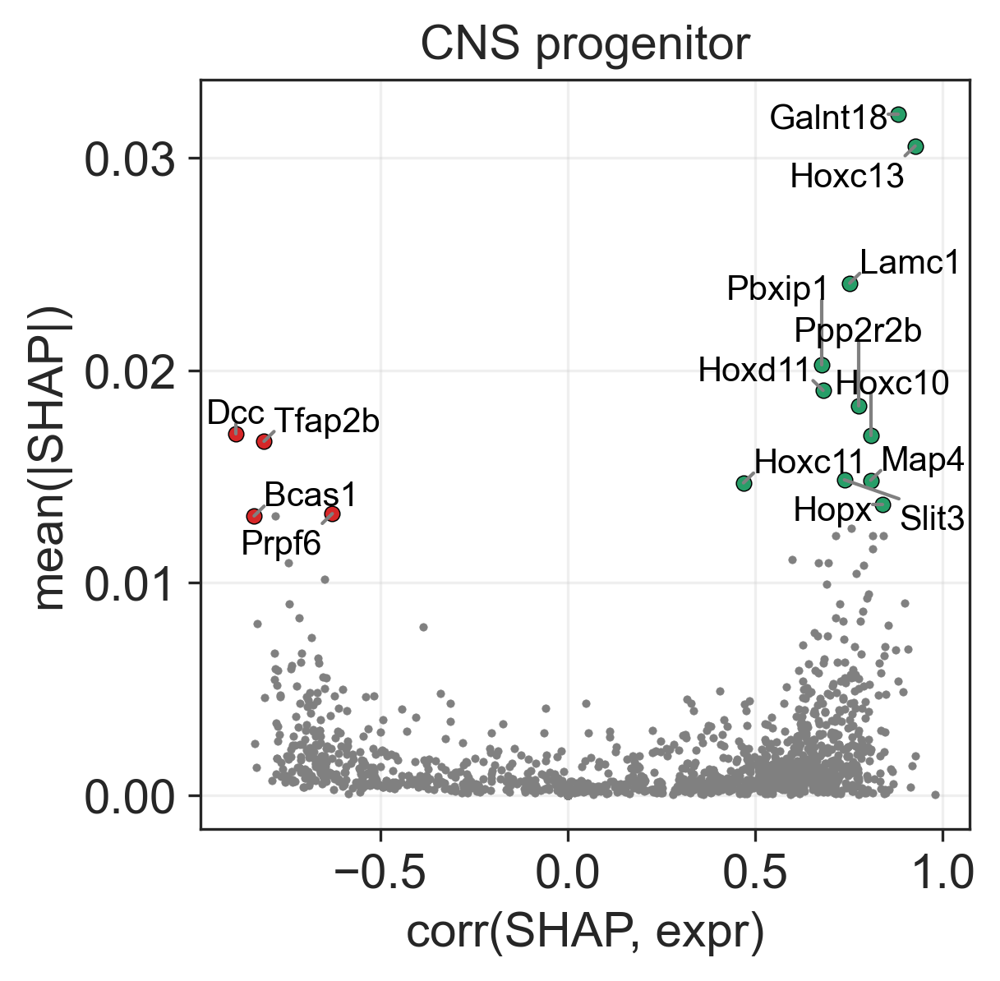

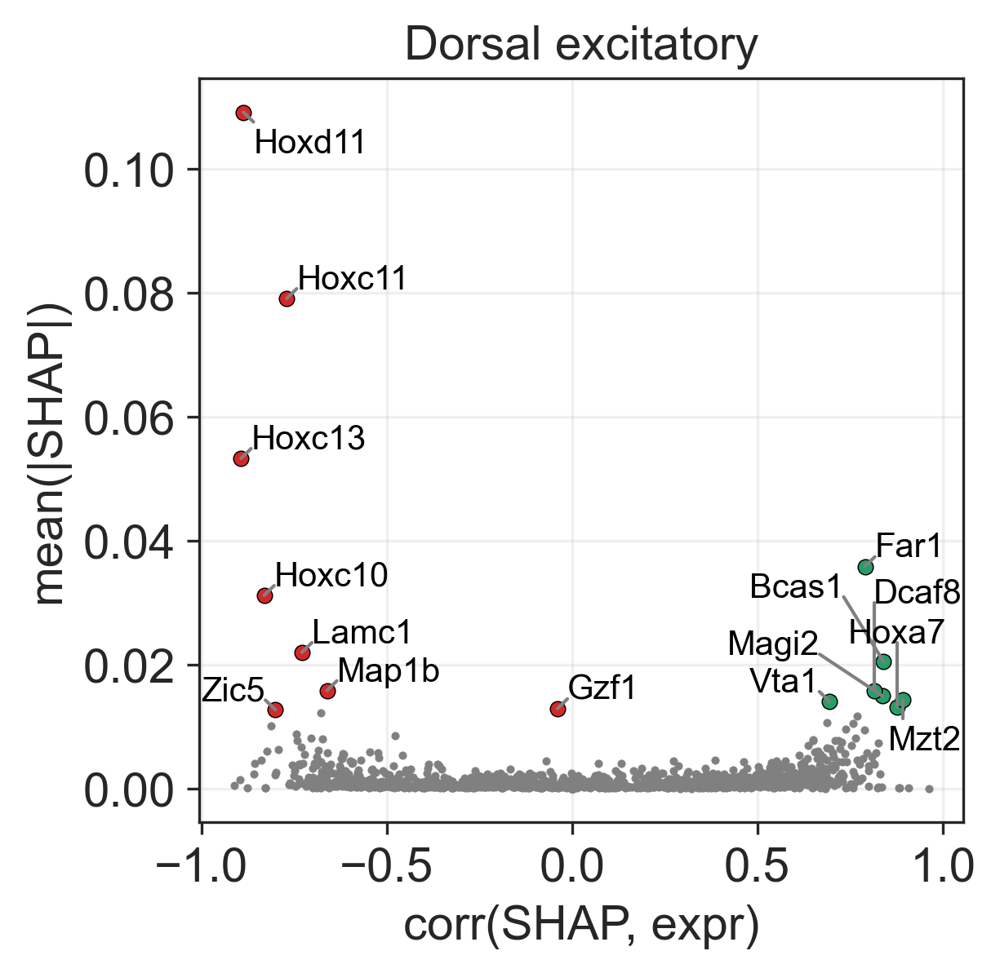

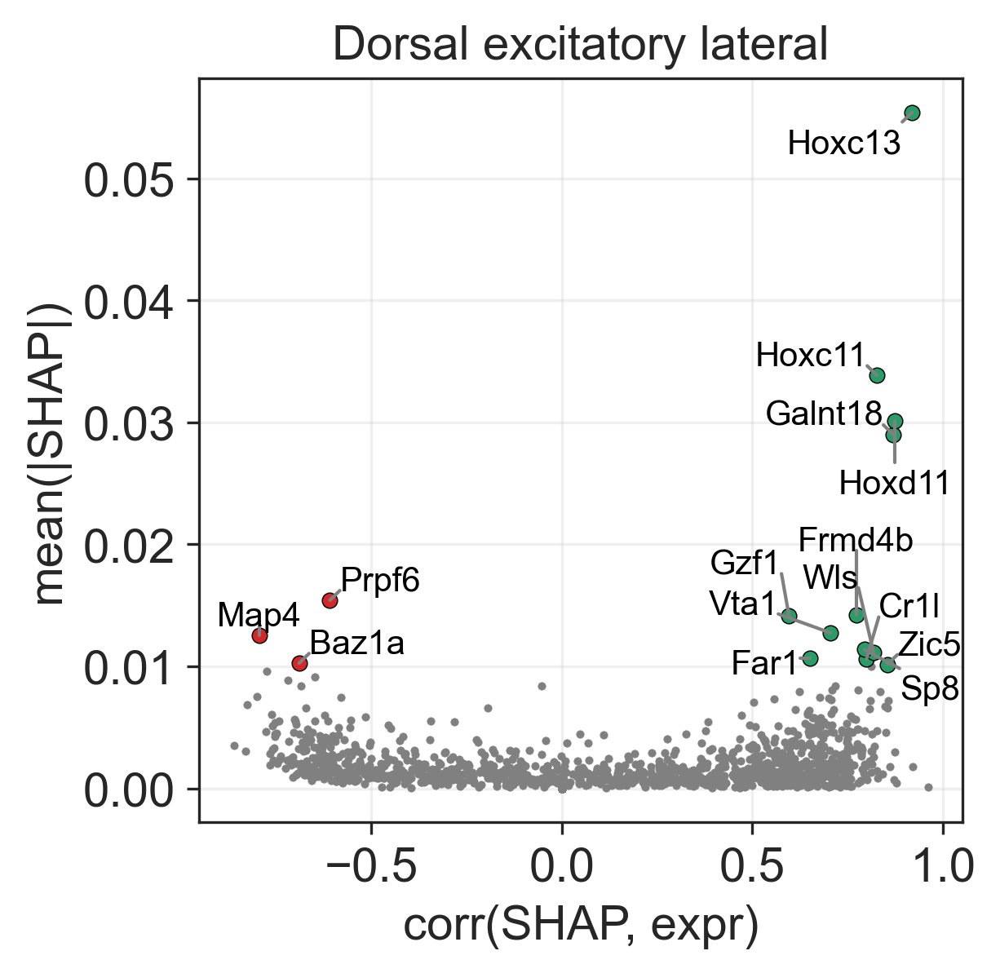

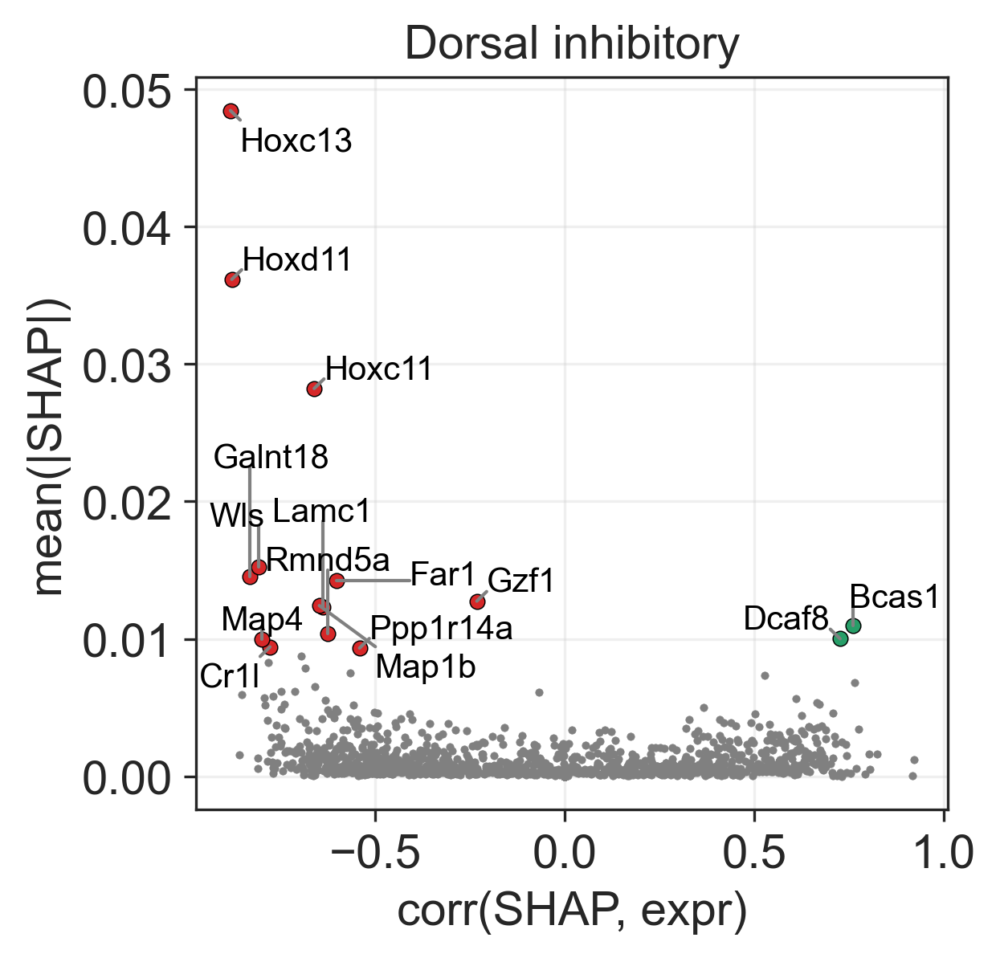

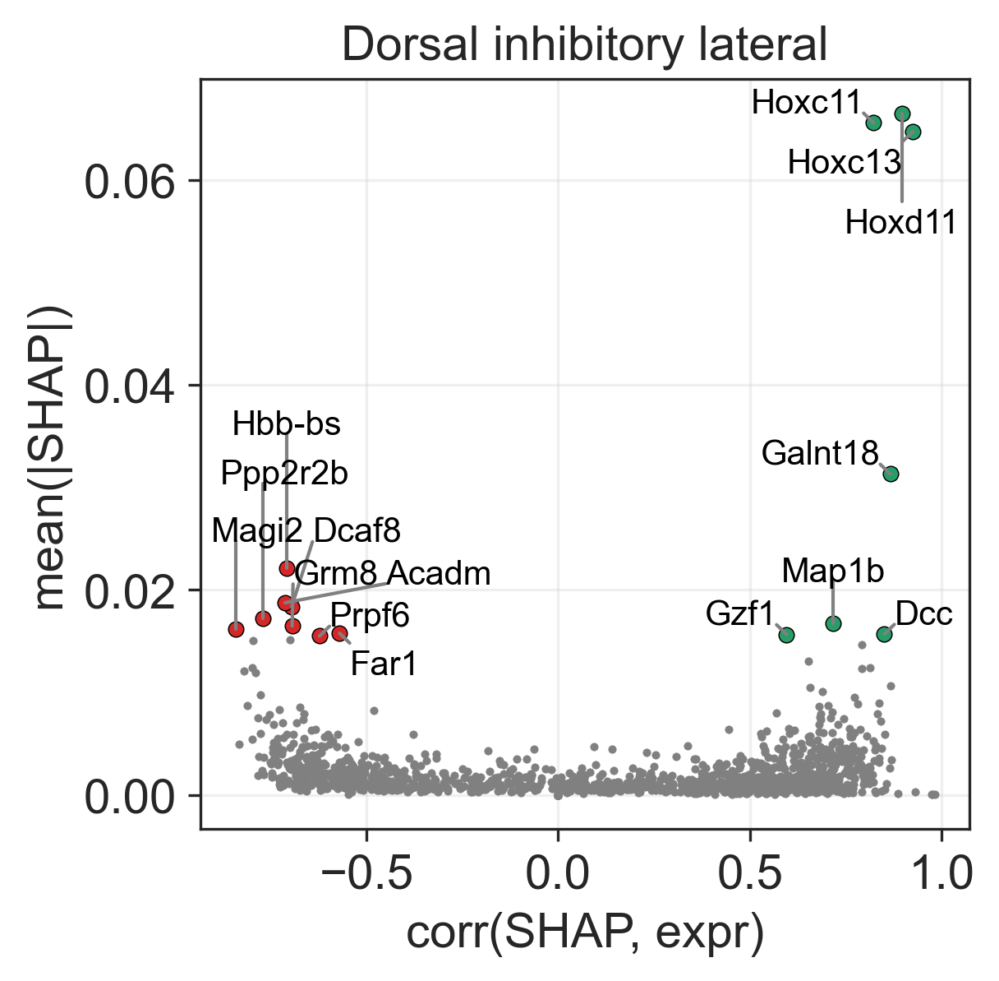

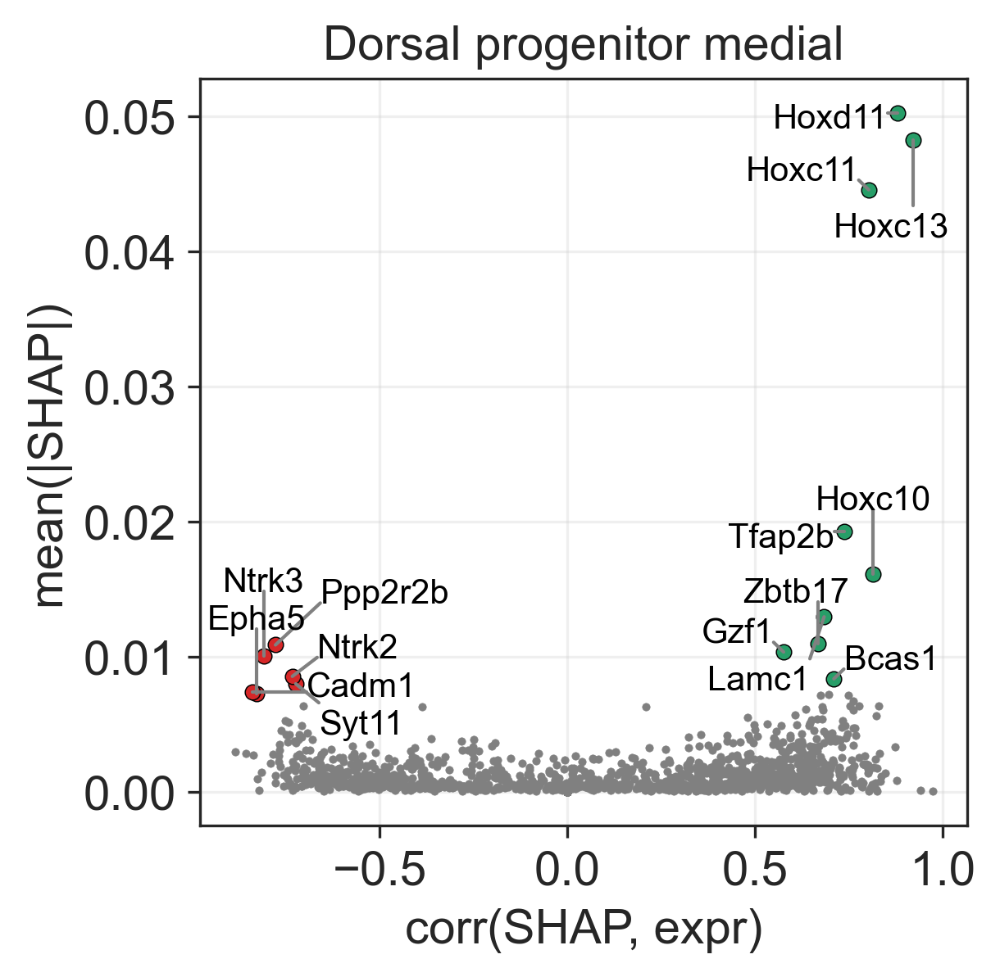

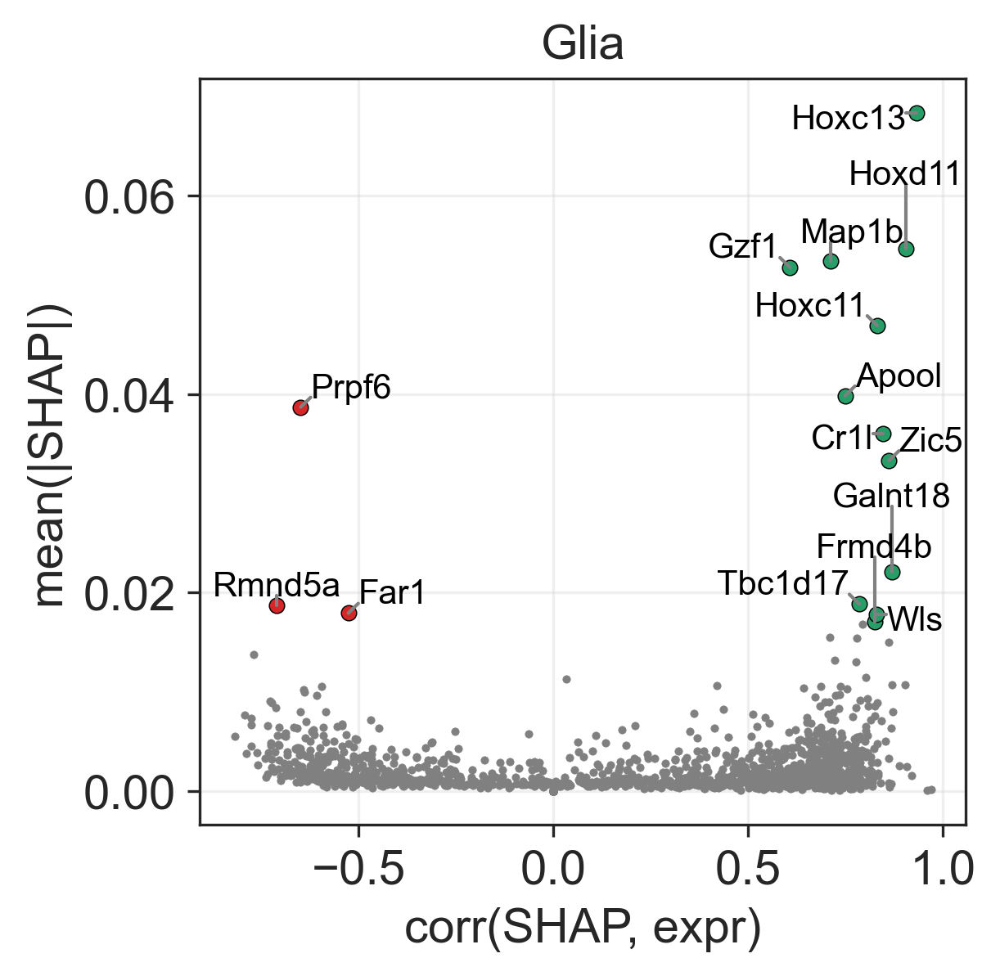

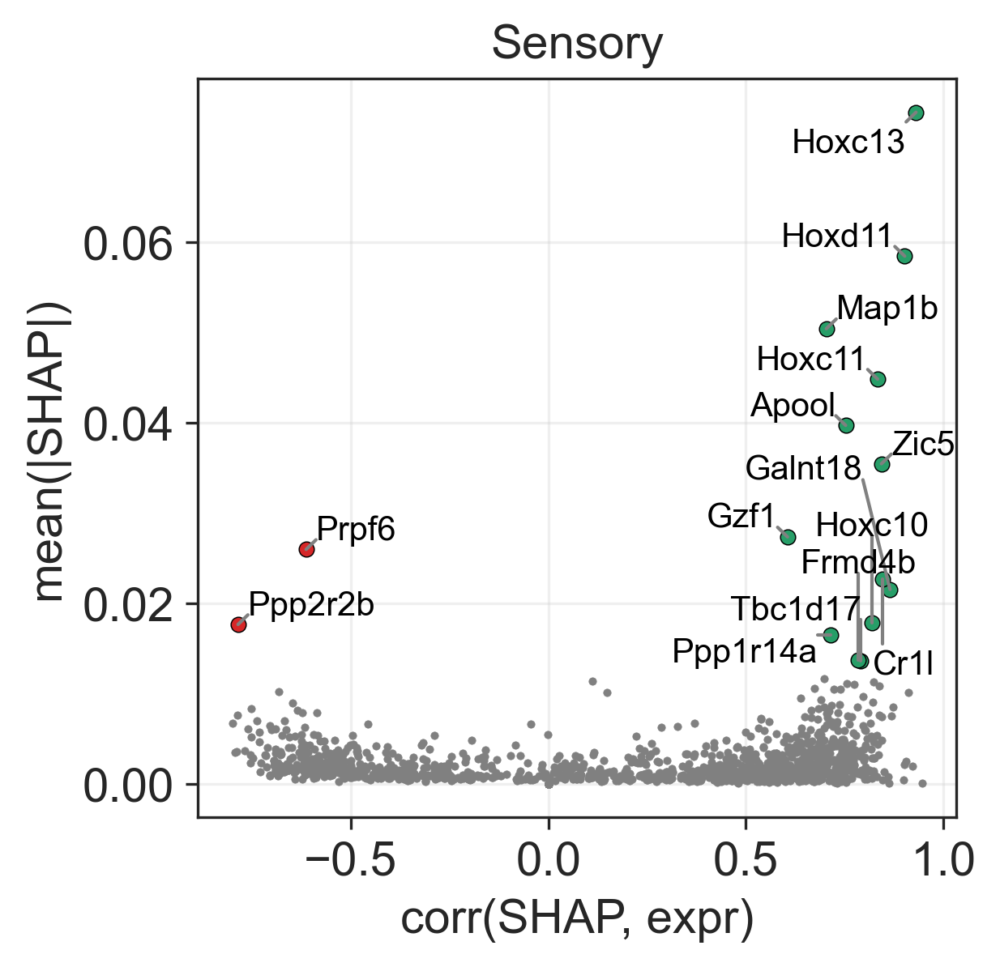

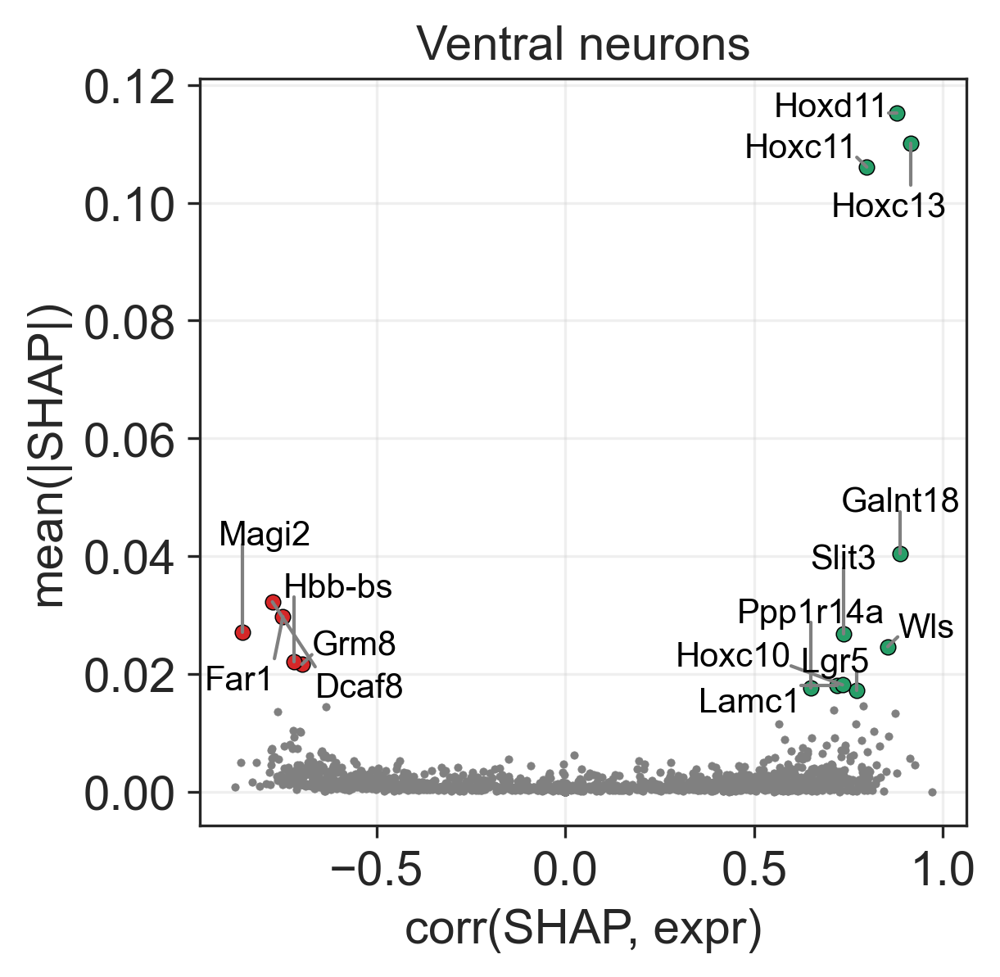

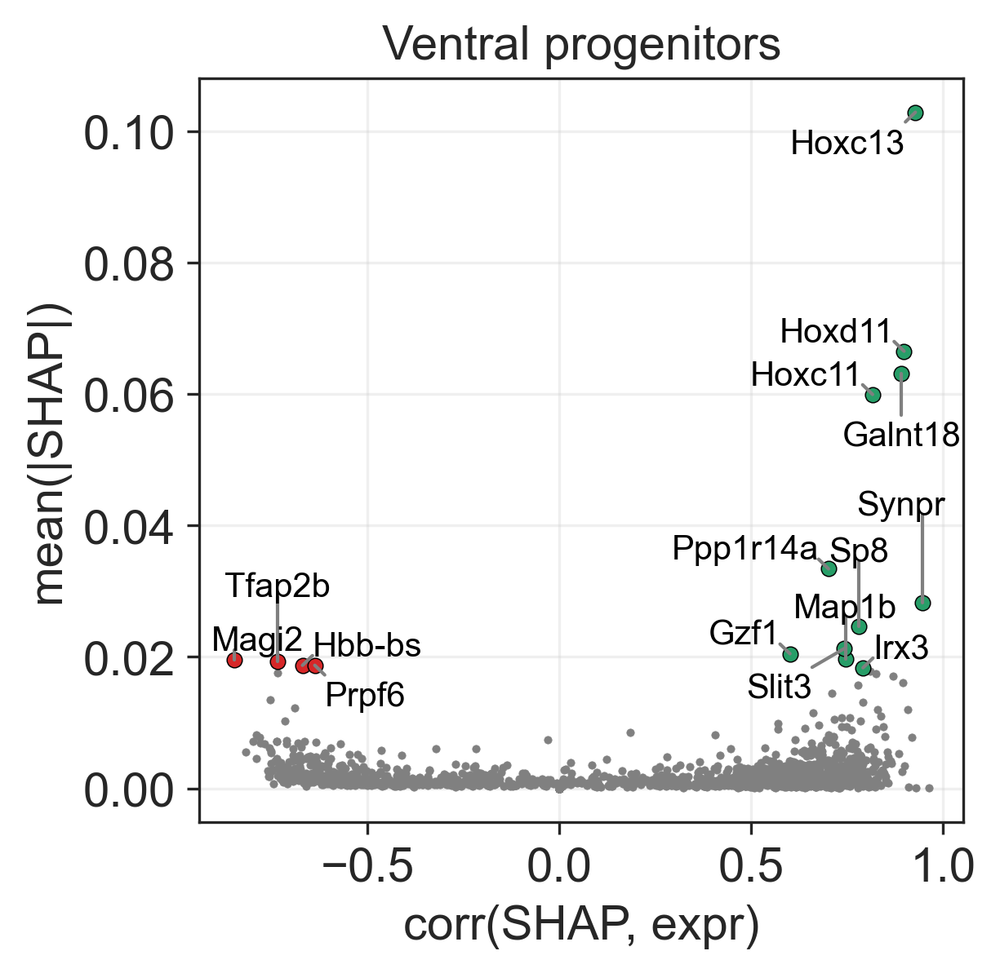

In [11]:
n_genes = 15

for ct in clones_clear.var_names:
    fig, ax = plt.subplots(figsize=(4, 4))
    
    df = pd.DataFrame({
        "shap_correlation": shapdata_ct.var[f"shap_corr_{ct}"].values,
        "mean_shap_mag": np.abs(shapdata_ct.layers[f"shap_{ct}"]).mean(axis=0).A[0],
    }, index=shapdata_ct.var_names)

    sns.scatterplot(
        x="shap_correlation",
        y="mean_shap_mag",
        data=df,
        edgecolor=None,
        s=5,
        color="grey",
        ax=ax,
    )

    # Top-predictors
    df_subset = df.loc[df.mean_shap_mag.sort_values()[-n_genes:].index]
    sns.scatterplot(
        x="shap_correlation",
        y="mean_shap_mag",
        data=df_subset[df_subset.shap_correlation > 0],
        edgecolor="black",
        s=20,
        color=sns.color_palette()[2],
        ax=ax,
    )
    
    sns.scatterplot(
        x="shap_correlation",
        y="mean_shap_mag",
        data=df_subset[df_subset.shap_correlation < 0],
        edgecolor="black",
        s=20,
        color=sns.color_palette()[3],
        ax=ax,
    )
    
    ta.allocate(
        ax,
        x=df_subset.shap_correlation,
        y=df_subset.mean_shap_mag,
        text_list=df_subset.index,
        x_scatter=df.shap_correlation,
        y_scatter=df.mean_shap_mag,
        textsize=10,
        linecolor="grey",
    )

    ax.set_xlabel("corr(SHAP, expr)")
    ax.set_ylabel("mean(|SHAP|)")
    ax.grid(alpha=0.3)
    ax.set_title(ct)

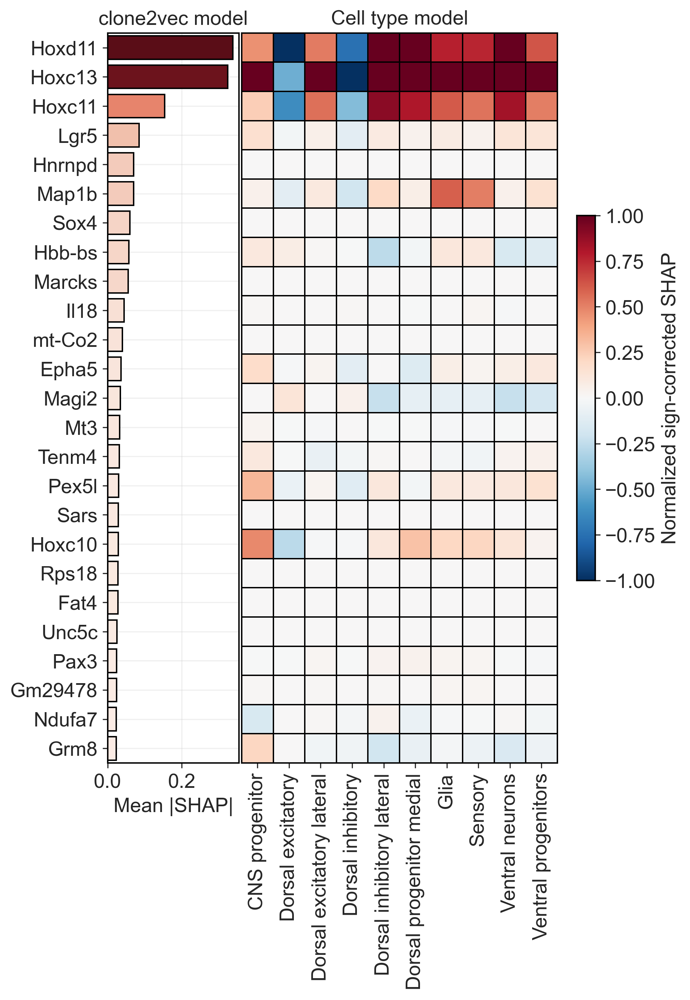

In [15]:
n_top_genes = 25
width = 7
cmap_barplot = "Reds"
cmap_heatmap = "RdBu_r"
normalize = True

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    top_genes = shapdata_c2v.var.gene_importance.sort_values(ascending=False)[:n_top_genes]
    cts = [i.split("_")[1] for i in list(shapdata_ct.layers.keys()) if "shap_" in i]

    fig, axes = plt.subplots(ncols=2, figsize=(width, 0.4 * n_top_genes), gridspec_kw={"width_ratios": [1, 3]})

    # Plotting of the clone2vec SHAP values

    # Create a colorscheme
    norm = plt.Normalize(0, top_genes.max())
    sm = plt.cm.ScalarMappable(cmap=cmap_barplot, norm=norm)
    bar_colors = plt.cm.get_cmap(cmap_barplot)(norm(top_genes))

    sns.barplot(
        x=top_genes,
        y=top_genes.index,
        ax=axes[0],
        edgecolor="k",
        palette=bar_colors,
    )
    axes[0].grid(alpha=0.3)
    axes[0].set_xlabel("Mean |SHAP|")
    axes[0].set_ylabel("")
    # axes[0].legend_.remove()
    axes[0].set_title("clone2vec model")
    
    for spine in axes[0].spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1)
        spine.set_edgecolor("k")

    heatmap = {}
    for ct in cts:
        heatmap[ct] = (
            np.abs(shapdata_ct[:, top_genes.index].layers[f"shap_{ct}"]).mean(axis=0).A[0] *
            shapdata_ct[:, top_genes.index].var[f"shap_corr_{ct}"].values
        )
        
    heatmap = pd.DataFrame(heatmap, index=top_genes.index)
    if normalize:
        heatmap = heatmap / np.abs(heatmap).max(axis=0)
    
    sns.heatmap(heatmap, cmap=cmap_heatmap, vmin=-heatmap.max().max(), ax=axes[1],
                linecolor="k", linewidth=0.5, cbar_kws={"shrink": 0.5})
    axes[1].set_yticks([], [])
    
    for spine in axes[1].spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1)
        spine.set_edgecolor("k")
        
    cbar = axes[1].collections[0].colorbar

    # Style the colorbar's border (spines)
    for spine in cbar.ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1)
        spine.set_edgecolor("k")
        
    axes[1].set_title("Cell type model")
    if normalize:
        cbar.set_label("Normalized sign-corrected SHAP")
    else:
        cbar.set_label("Sign-corrected SHAP")
    
plt.tight_layout()
plt.subplots_adjust(wspace=0.01)

plt.savefig("figures_CatBoost_Progenitors/overview_neurons.pdf", bbox_inches="tight")